# Used Packages

In [4]:
import os
import glob
import gc

import numpy as np
import pandas as pd
import zipfile
import matplotlib.pyplot as plt
from tqdm import tqdm
import math

from scipy.spatial.transform import Rotation as R

from utils.MovingAverager import *
from collections import defaultdict
from torchinfo import summary

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import accuracy_score

# Global Variable

In [5]:
rotation = True
num_of_axie = 3

datapoint_per_second = 20
duration = 2
seq_len = 10

In [6]:
validation_traj = np.load(f'./npys/all_user_match_data.npy', allow_pickle=True)

In [22]:
class KalmanFilter:
    def __init__(self, dt, gyro_noise_std, acc_noise_std):
        self.dt = dt
        self.gyro_noise_std = gyro_noise_std
        self.acc_noise_std = acc_noise_std
        
        self.Q = np.eye(3) * gyro_noise_std**2
        self.R = np.eye(3) * acc_noise_std**2
        
        self.P = np.eye(3)
        self.x = np.zeros(3)
    
    def predict(self, gyro_measurements):
        F = np.eye(3) + self.dt * self.skew_symmetric(gyro_measurements)
        self.x = F @ self.x
        self.P = F @ self.P @ F.T + self.Q
    
    def update(self, acc_measurements, Rk):
        z = acc_measurements
        H = np.eye(3)
        y = z - H @ self.x
        S = H @ self.P @ H.T + Rk
        K = self.P @ H.T @ np.linalg.inv(S)
        self.x = self.x + K @ y
        self.P = (np.eye(3) - K @ H) @ self.P
    
    def skew_symmetric(self, v):
        return np.array([[0, -v[2], v[1]], [v[2], 0, -v[0]], [-v[1], v[0], 0]])

class AttitudeEstimator:
    def __init__(self, dt, gyro_noise_std, acc_noise_std, method='STF'):
        self.kf = KalmanFilter(dt, gyro_noise_std, acc_noise_std)
        self.method = method
    
    def estimate_attitude(self, gyro_measurements, acc_measurements):
        self.kf.predict(gyro_measurements)
        Rk = self.adaptive_measurement_noise_covariance(acc_measurements)
        self.kf.update(acc_measurements, Rk)
        return self.kf.x
    
    def adaptive_measurement_noise_covariance(self, acc_measurements):
        if self.method == 'STF':
            return self.adaptive_measurement_noise_covariance_stf(acc_measurements)
        elif self.method == 'MTF':
            return self.adaptive_measurement_noise_covariance_mtf(acc_measurements)
        else:
            raise ValueError("Method must be 'STF' or 'MTF'")
    
    def adaptive_measurement_noise_covariance_stf(self, acc_measurements):
        innovation = acc_measurements - self.kf.x
        St = np.sum(innovation**2) / 3 - np.trace(self.kf.R) / 3
        St = max(0, St)
        return np.eye(3) * St
    
    def adaptive_measurement_noise_covariance_mtf(self, acc_measurements):
        innovation = acc_measurements - self.kf.x
        St = np.zeros(3)
        for i in range(3):
            St[i] = max(0, innovation[i]**2 - self.kf.R[i, i])
        return np.diag(St)
    
    def get_roll_pitch(self):
        roll = np.arctan2(self.kf.x[1], self.kf.x[2])
        pitch = np.arctan2(-self.kf.x[0], np.sqrt(self.kf.x[1]**2 + self.kf.x[2]**2))
        return roll, pitch

class RotationMatrixCalculator:
    @staticmethod
    def from_roll_pitch(roll, pitch):
        R_x = np.array([
            [1, 0, 0],
            [0, np.cos(roll), -np.sin(roll)],
            [0, np.sin(roll), np.cos(roll)]
        ])
        
        R_y = np.array([
            [np.cos(pitch), 0, np.sin(pitch)],
            [0, 1, 0],
            [-np.sin(pitch), 0, np.cos(pitch)]
        ])
        
        R = R_x @ R_y
        return R

estimator = AttitudeEstimator(0.05, 0.01, 0.1, 'MTF')    

def process_sequence(gyro_data, acc_data, acc_lin_data, mag_data):
    rotation_matrices = []
    rotated_acc_data = []
    rotated_acc_lin_data = []
    rotated_mag_data = []
    rotated_gyro_data = []
    
    for gyro_measurements, acc_measurements, acc_lin_measurements, mag_measurements in zip(gyro_data, acc_data, acc_lin_data, mag_data):
        estimator.estimate_attitude(np.array(gyro_measurements), np.array(acc_measurements))
        roll, pitch = estimator.get_roll_pitch()
        R = RotationMatrixCalculator.from_roll_pitch(roll, pitch)
        
        rotated_acc = R @ np.array(acc_measurements)
        rotated_gyro = R @ np.array(gyro_measurements)
        rotated_acc_lin = R @ np.array(acc_lin_measurements)
        rotated_mag = R @ np.array(mag_measurements)
        
        rotation_matrices.append(R)
        rotated_acc_data.append(rotated_acc)
        rotated_acc_lin_data.append(rotated_acc_lin)
        rotated_gyro_data.append(rotated_gyro)
        rotated_mag_data.append(rotated_mag)
    
    return np.concatenate((np.array(rotated_acc_data), np.array(rotated_acc_lin_data), np.array(rotated_gyro_data)), axis=-1), np.array(rotated_mag_data),

In [9]:
def get_data(validation_traj, num_of_axie, rotation=True):
    posture_data = defaultdict(list)

    valid_data = validation_traj.item()
    for user_name in valid_data.keys():
        for path_name in valid_data[user_name].keys():
            for posture_name in valid_data[user_name][path_name].keys():
                data = valid_data[user_name][path_name][posture_name]

                if posture_name == 'ref_mag':
                    if num_of_axie == 2:
                        posture_data[posture_name].append(data[:, [0, 1, 6, 7, 5]])
                    else:
                        posture_data[posture_name].append(data[:, [0, 1, 2, 3, 4, 6, 7, 5]])
                    continue

                pos = (data[:, [0, 1]] + np.array((1, 1))) * 0.6
                imu = data[:, [3, 4, 5, 6, 7, 8, 9, 10, 11]]
                mag = data[:, [12, 13, 14]]

                if rotation:
                    imu, mag = process_sequence(imu[:, 6:9], imu[:, 0:3], imu[:, 3:6], mag)
                else:
                    if num_of_axie == 2: 
                        mag = np.column_stack((np.sqrt(np.sum(mag[:, :2]**2, axis=1)), mag[:, 2]))
                pos_mag = np.concatenate((pos, imu, mag, data[:, [15]]), axis=-1)            
                posture_data[posture_name].append(pos_mag)
    return posture_data

In [10]:
def split_traj(trajs, length=100):
    sp_traj = []
    for traj in trajs:
        for i in range(len(traj) - length + 1):
            sp_traj.append(traj[i:i+length])
    return np.array(sp_traj)

# Data Loader

In [11]:
class PairDataset(Dataset):
    def __init__(self, source_data, source_label, target_data, target_label):
        assert (source_data.shape[0] == source_label.shape[0] == target_data.shape[0] == target_label.shape[0]), f'{source_data.shape}, {source_label.shape}, {target_data.shape}, {target_label.shape}'
        self.source_data = source_data
        self.source_label = source_label
        self.target_data = target_data
        self.target_label = target_label
        
        self.align_yaw = self.calculate_yaw_difference(self.source_data[:, :, 11:14], self.target_data[:, :, 2:5]).reshape((-1, 1))
        print(self.align_yaw.shape)
    
    def normalize_vector(self, v):
        """ Normalize a vector to unit length. """
        norm = np.linalg.norm(v, axis=1, keepdims=True)
        return np.where(norm == 0, v, v / norm)
    
    def calculate_yaw_difference(self, mag_a, mag_b):
        v_as = self.normalize_vector(mag_a)
        v_bs = self.normalize_vector(mag_b)
        cross_prods = np.cross(v_as, v_bs)
        dot_prods = np.einsum('ijk, ijk->ij', v_as, v_bs)  # Sum across the last dimension for each timestep
        angles = np.arccos(np.clip(dot_prods, -1.0, 1.0))
        mean_angles = np.mean(angles, axis=1)
        return mean_angles
    
    def __len__(self):
        return len(self.source_data)

    def __getitem__(self, idx):
        return self.source_data[idx], self.source_label[idx], self.target_data[idx], self.target_label[idx], self.align_yaw[idx]

In [12]:
def for_dataloaders(traj, gt='target'):
    t_data = 0
    t_label = 0
    t_target_data = 0
    v_data = 0
    v_label = 0
    v_target_data = 0
    label = 1
    label_dict = {}
    flag = False
    for key, value in traj.items():
        split = int(len(value) * 9 / 10)
        tmp1, tmp2 = value[0:split], value[split:]
        if key != gt: 
            t_data = np.concatenate((t_data, tmp1)) if flag else tmp1
            t_label = np.concatenate((t_label, np.full((tmp1.shape[0], ), label))) if flag else np.full((tmp1.shape[0], ), label)
            v_data = np.concatenate((v_data, tmp2)) if flag else tmp2
            v_label = np.concatenate((v_label, np.full((tmp2.shape[0], ), label))) if flag else np.full((tmp2.shape[0], ), label)
            flag = True
            label_dict[label] = key
            label += 1
        else:
            t_target_data = np.tile(tmp1, (4, 1, 1))
            v_target_data = np.tile(tmp2, (4, 1, 1))
            label_dict[0] = key
    
    train_dataset = PairDataset(
                        source_data = torch.tensor(t_data, dtype=torch.float),
                        source_label = t_label,
                        target_data = torch.tensor(t_target_data, dtype=torch.float),
                        target_label = np.zeros((len(t_target_data), ))
                    )
    
    valid_dataset = PairDataset(
                        source_data = torch.tensor(v_data, dtype=torch.float),
                        source_label = v_label,
                        target_data = torch.tensor(v_target_data, dtype=torch.float),
                        target_label = np.zeros((len(v_target_data), ))
                    )

    print(label_dict, len(train_dataset), len(valid_dataset))
    return label_dict, train_dataset, valid_dataset

# Model Declaration

In [13]:
class CustomCNN(nn.Module):
    def __init__(self):
        super(CustomCNN, self).__init__()
        # First convolutional block
        self.conv1 = nn.Conv1d(in_channels=6, out_channels=32, kernel_size=20, stride=5)
        self.bn1 = nn.BatchNorm1d(32)

        # Second convolutional block
        self.conv2 = nn.Conv1d(in_channels=32, out_channels=64, kernel_size=3, stride=1)
        self.bn2 = nn.BatchNorm1d(64)

        # Third convolutional block
        self.conv3 = nn.Conv1d(in_channels=64, out_channels=128, kernel_size=3, stride=1)
        self.bn3 = nn.BatchNorm1d(128)

        # Mean pooling layer
        self.mean_pool = nn.AdaptiveAvgPool1d(1)

        # First linear block
        self.fc1 = nn.Linear(128, 32)
        self.bn4 = nn.BatchNorm1d(32)

        # Second linear block
        self.fc2 = nn.Linear(32, 16)
        self.bn5 = nn.BatchNorm1d(16)
        
        self.fc = nn.Linear(16, 1)

    def forward(self, x):
        # Apply the first convolutional block
        x = F.relu(self.bn1(self.conv1(x)))

        # Apply the second convolutional block
        x = F.relu(self.bn2(self.conv2(x)))

        # Apply the third convolutional block
        x = F.relu(self.bn3(self.conv3(x)))

        # Apply mean pooling
        x = self.mean_pool(x)
        x = x.view(x.size(0), -1)  # Flatten the output

        # Apply the first linear block
        x = F.relu(self.bn4(self.fc1(x)))

        # Apply the second linear block
        x = F.relu(self.bn5(self.fc2(x)))
        x = self.fc(x)
        return x

In [14]:
model = CustomCNN()
summary(model, input_size=[(1, 6, 100)])

Layer (type:depth-idx)                   Output Shape              Param #
CustomCNN                                [1, 1]                    --
├─Conv1d: 1-1                            [1, 32, 17]               3,872
├─BatchNorm1d: 1-2                       [1, 32, 17]               64
├─Conv1d: 1-3                            [1, 64, 15]               6,208
├─BatchNorm1d: 1-4                       [1, 64, 15]               128
├─Conv1d: 1-5                            [1, 128, 13]              24,704
├─BatchNorm1d: 1-6                       [1, 128, 13]              256
├─AdaptiveAvgPool1d: 1-7                 [1, 128, 1]               --
├─Linear: 1-8                            [1, 32]                   4,128
├─BatchNorm1d: 1-9                       [1, 32]                   64
├─Linear: 1-10                           [1, 16]                   528
├─BatchNorm1d: 1-11                      [1, 16]                   32
├─Linear: 1-12                           [1, 1]                    17

In [15]:
device = torch.device("cuda" if (torch.cuda.is_available()) else "cpu")
mse_loss = torch.nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, betas=(0.9, 0.999))

In [16]:
def plot_result(result):
    sorc_mag = result[0].reshape(-1, num_of_axie)
    pred_mag = result[1].reshape(-1, num_of_axie)
    targ_mag = result[2].reshape(-1, num_of_axie)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for sm, pm, tm, caxis, color in zip(sorc_mag.T, pred_mag.T, targ_mag.T, ['x', 'y', 'z'][:num_of_axie], ['tab:blue', 'tab:orange', 'tab:green'][:num_of_axie]):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
#         plt.plot(x, sm, ':', label=f'src_{caxis}', color=color, linewidth=2.5, zorder=3)
    
    sorc_total_mag = np.sqrt(np.sum(np.power(sorc_mag, 2), axis=-1))
    pred_total_mag = np.sqrt(np.sum(np.power(pred_mag, 2), axis=-1))
    targ_total_mag = np.sqrt(np.sum(np.power(targ_mag, 2), axis=-1))
    plt.plot(x, pred_total_mag, label=f'pred_t', color='tab:red', linewidth=2.5, zorder=2)
    plt.plot(x, targ_total_mag, '--', label=f'targ_t', color='tab:red', linewidth=1, alpha=0.8, zorder=1)
#     plt.plot(x, sorc_total_mag, ':', label=f'src_t', color="tab:red", linewidth=2.5, zorder=3)
    
    plt.suptitle(f'Loss: {loss:.2f}')
    plt.legend()
    plt.show()

In [17]:
def train(dataloader, draw=False):
    model.train()
    gen_losses = []

    for source_data, source_label, target_data, target_label, align_yaw in dataloader:
        optimizer.zero_grad()

        source_data = source_data.to(device)
        source_imu = source_data[:, :, 5:11]
        source_imu = torch.permute(source_imu, (0, 2, 1))
        source_mag = source_data[:, :, 11:14]
        
        target_data = target_data.to(device)
        target_mag = target_data[:, :, 2:5]
        align_yaw = align_yaw.to(device)

        # generate mag
        yaw_angles = model(source_imu)
        
        # generator loss
        gen_loss = mse_loss(align_yaw, yaw_angles)
        
        # backward
        gen_loss.backward()
        optimizer.step()
        
        # record loss
        gen_losses.append(gen_loss.item())
    
        if draw:
            cos_angles = torch.cos(yaw_angles)
            sin_angles = torch.sin(yaw_angles)
            zeros = torch.zeros_like(cos_angles)
            ones = torch.ones_like(cos_angles)

            R = torch.stack([
                cos_angles, -sin_angles, zeros,
                sin_angles, cos_angles, zeros,
                zeros, zeros, ones
            ], dim=-1).view(-1, 3, 3)

            R_expanded = R.unsqueeze(1)

            transformed_data = torch.matmul(R_expanded, source_mag.unsqueeze(-1))
            predict_mag = transformed_data.squeeze(-1)

            rs = [source_mag[0].detach().cpu().numpy() ,predict_mag[0].detach().cpu().numpy(), target_mag[0].cpu().numpy()]
            plot_result(rs)
    
    return np.mean(gen_losses)

In [18]:
def evalute(dataloader, draw=False):
    model.eval()

    gen_losses = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label, align_yaw in dataloader:
            source_data = source_data.to(device)
            source_imu = source_data[:, :, 5:11]
            source_imu = torch.permute(source_imu, (0, 2, 1))
            source_mag = source_data[:, :, 11:14]

            target_data = target_data.to(device)
            target_mag = target_data[:, :, 2:5]
            align_yaw = align_yaw.to(device)

            # generate mag
            yaw_angles = model(source_imu)

            # generator loss
            gen_loss = mse_loss(align_yaw, yaw_angles)

            # record loss
            gen_losses.append(gen_loss.item())

            if draw:
                cos_angles = torch.cos(yaw_angles)
                sin_angles = torch.sin(yaw_angles)
                zeros = torch.zeros_like(cos_angles)
                ones = torch.ones_like(cos_angles)
                
                R = torch.stack([
                    cos_angles, -sin_angles, zeros,
                    sin_angles, cos_angles, zeros,
                    zeros, zeros, ones
                ], dim=-1).view(-1, 3, 3)
                
                R_expanded = R.unsqueeze(1)

                transformed_data = torch.matmul(R_expanded, source_mag.unsqueeze(-1))
                predict_mag = transformed_data.squeeze(-1)

                rs = [source_mag[0].detach().cpu().numpy() ,predict_mag[0].detach().cpu().numpy(), target_mag[0].cpu().numpy()]
                plot_result(rs)
    
    return np.mean(gen_losses)

In [19]:
def output_eval(model, dataloader):
    model.eval()
    
    results = []
    class_results = []
    class_labels = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            source_imu = source_data[:, :, 5:11]
            source_imu = torch.permute(source_imu, (0, 2, 1))
            source_mag = source_data[:, :, 11:14]

            target_data = target_data.to(device)
            target_mag = target_data[:, :, 2:5]
            align_yaw = align_yaw.to(device)

            # generate mag
            yaw = model(source_imu)

            # generator loss
#             gen_loss, imu_loss, mag_loss = generator_loss(z_imu, target_imu, predict_mag, target_mag)

            # record loss
            predict_mag = predict_mag.detach().cpu().numpy()
            target_pos = target_pos.detach().cpu().numpy()
            target_mag = target_mag.cpu().numpy()
            source_label = source_label.detach().cpu().numpy()
            
            results.extend(zip(predict_mag, target_mag, source_label, target_pos))
            
            diff = np.power(predict_mag.reshape(len(predict_mag), -1, num_of_axie) - target_mag.reshape(len(target_mag), -1, num_of_axie), 2).mean(axis=1)
            class_results.extend(diff)
            class_labels.extend(source_label)
    
    return np.array(results, dtype=object), np.array(class_results), np.array(class_labels)

In [20]:
def show_result(model, dataloader):
    results, cres, clabel = output_eval(model, dataloader)
    print(results.shape, cres.shape, clabel.shape)

    if num_of_axie == 3:
        print(f'{"loss name":>20}| {"diff x":>8} {"diff y":>8} {"diff z":>8} {"avg":>8}')
        for class_label, class_name in classes.items():
            if sum(clabel == class_label) <= 0:
                continue
            dx, dy, dz = cres[clabel == class_label].mean(axis=0)
            print(f'{class_name:>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')
        dx, dy, dz = cres.mean(axis=0)
        print(f'{"average":>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')
    
    elif num_of_axie == 2:
        print(f'{"loss name":>20}| {"diff x":>8} {"diff y":>8} {"avg":>8}')
        for class_label, class_name in classes.items():
            if sum(clabel == class_label) <= 0:
                continue
            dx, dy = cres[clabel == class_label].mean(axis=0)
            print(f'{class_name:>15} loss: {dx:>8.2f} {dy:>8.2f} {np.mean([dx, dy]):>8.2f}')
        dx, dy = cres.mean(axis=0)
        print(f'{"average":>15} loss: {dx:>8.2f} {dy:>8.2f} {np.mean([dx, dy]):>8.2f}')

    for rs in results[::500]:
        plot_result(rs)

# Experiment 1
rotation = False
num_of_axie = 2Different final ground truth (最終姿態)

In [23]:
num_of_axie, rotation = 3, True
posture_data = get_data(validation_traj, num_of_axie, rotation)
prep_valid_traj = defaultdict(np.array)

prep_valid_traj['front_pocket'] = split_traj(posture_data['front_pocket'])
prep_valid_traj['pocket']       = split_traj(posture_data['pocket'])
prep_valid_traj['swing']        = split_traj(posture_data['swing'])
prep_valid_traj['target']       = split_traj(posture_data['target'])
prep_valid_traj['horizontal']      = split_traj(posture_data['horizontal'])

In [24]:
classes, train_dataset, valid_dataset = for_dataloaders(prep_valid_traj, gt='target')

(52, 1)
(8, 1)
{1: 'front_pocket', 2: 'pocket', 3: 'swing', 0: 'target', 4: 'horizontal'} 52 8


In [25]:
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=2, shuffle=False)

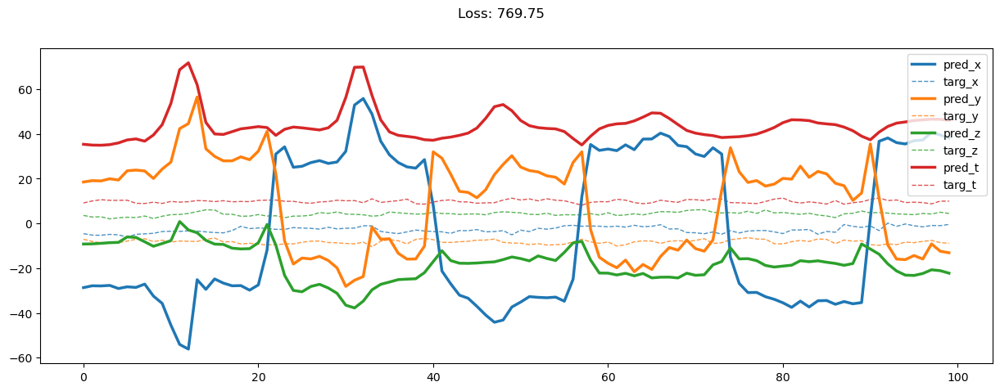

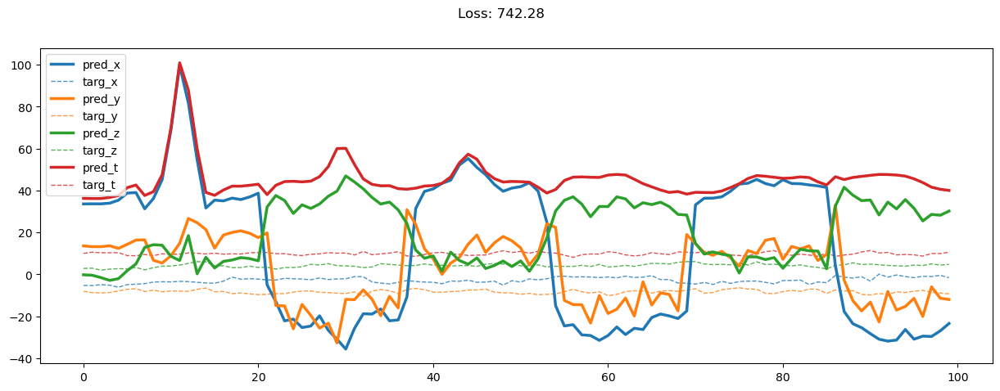

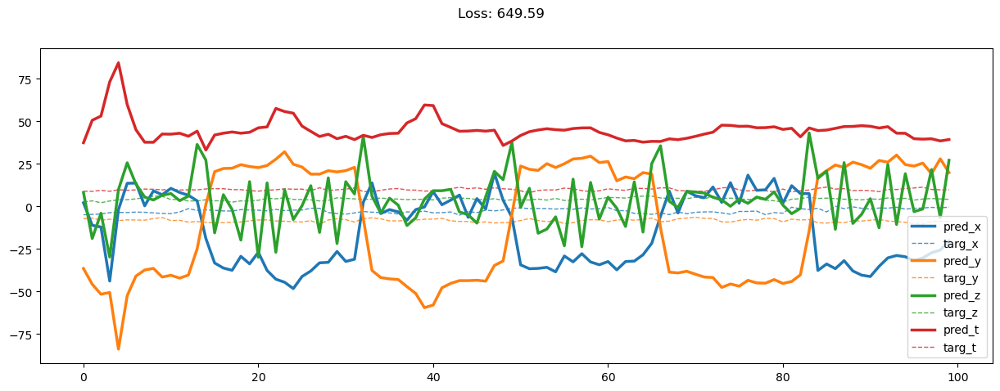

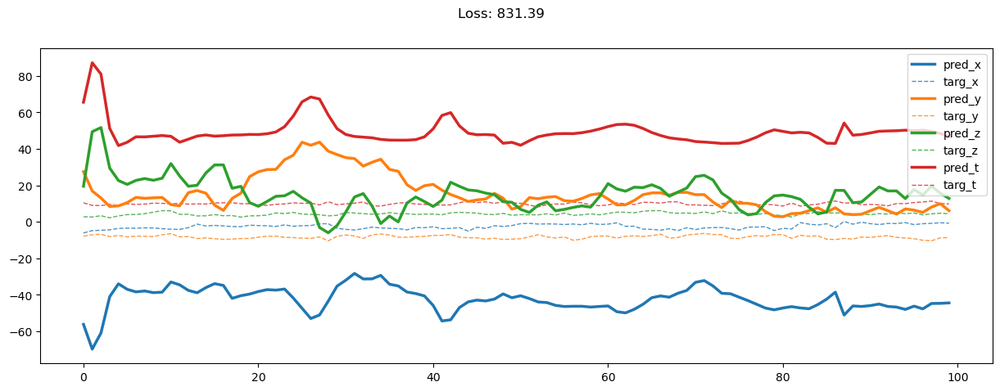

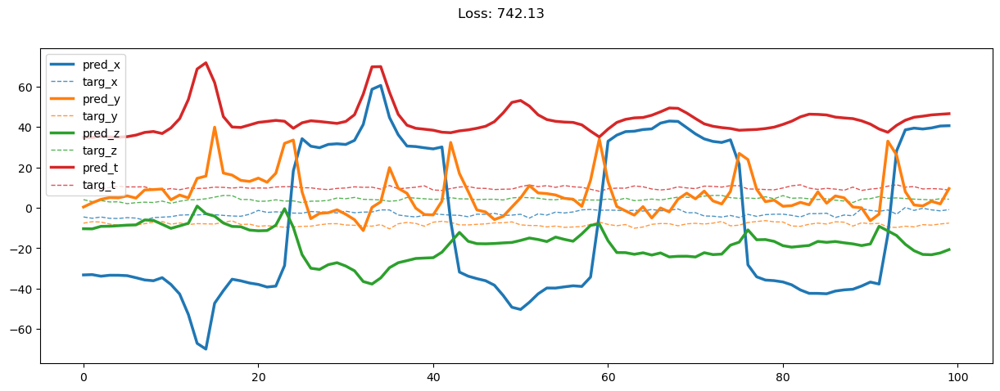

...

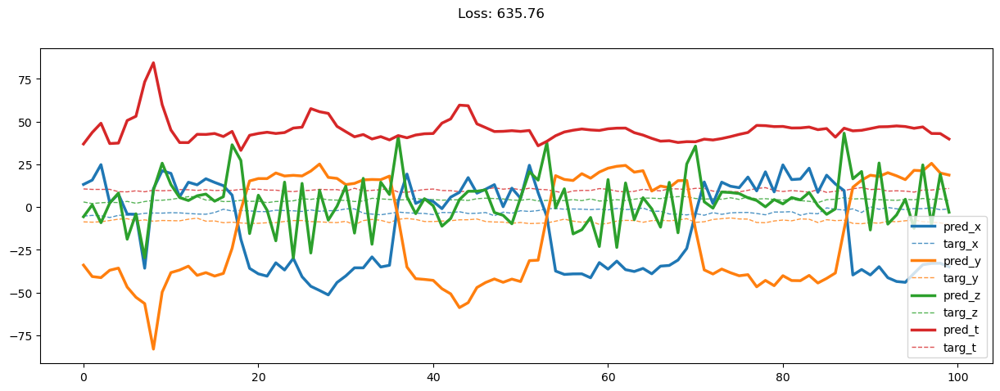

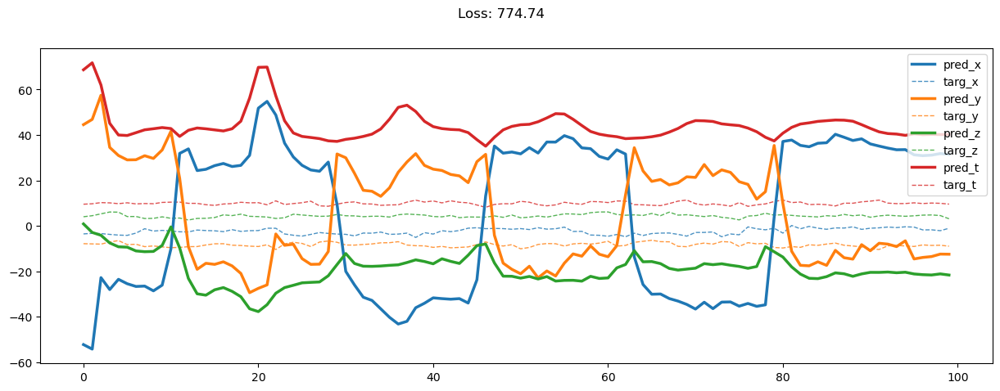

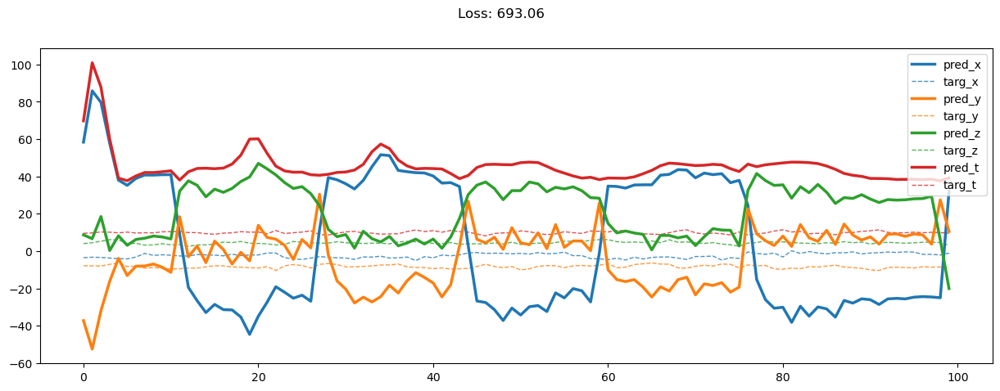

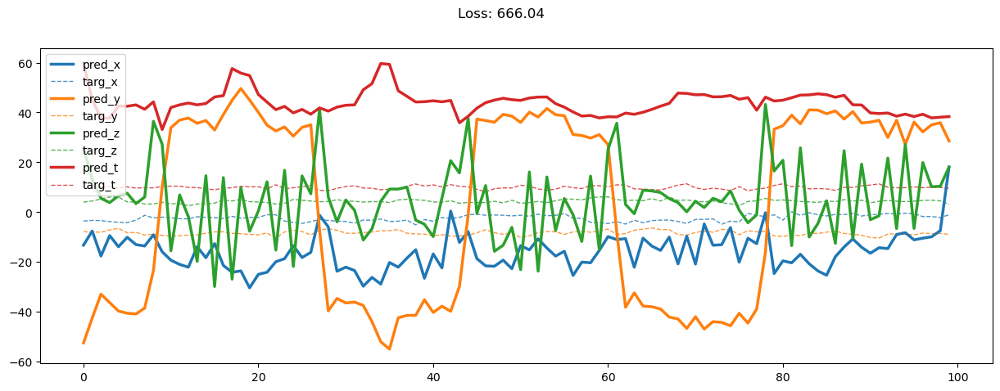

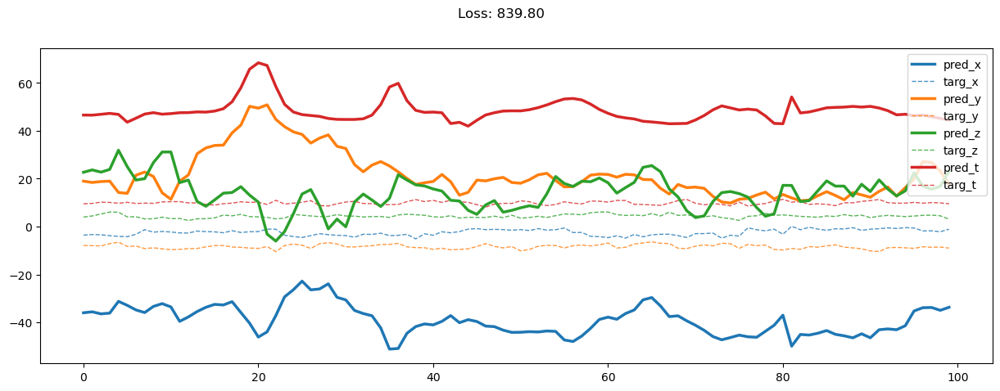

00000: train loss:  0.746
       valid loss:  1.666
00100: train loss:  0.006
       valid loss:  0.015
00200: train loss:  0.005
       valid loss:  0.007
00300: train loss:  0.002
       valid loss:  0.005
00400: train loss:  0.001
       valid loss:  0.008
00500: train loss:  0.002
       valid loss:  0.005
00600: train loss:  0.000
       valid loss:  0.004
00700: train loss:  0.001
       valid loss:  0.003
00800: train loss:  0.000
       valid loss:  0.003
00900: train loss:  0.001
       valid loss:  0.004


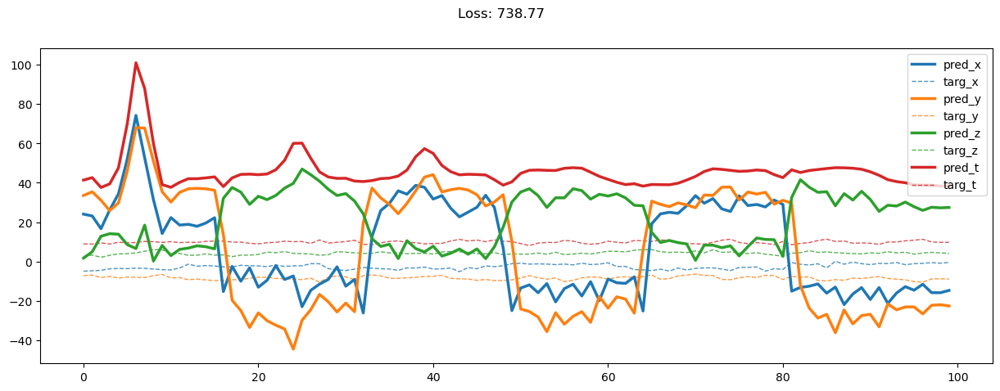

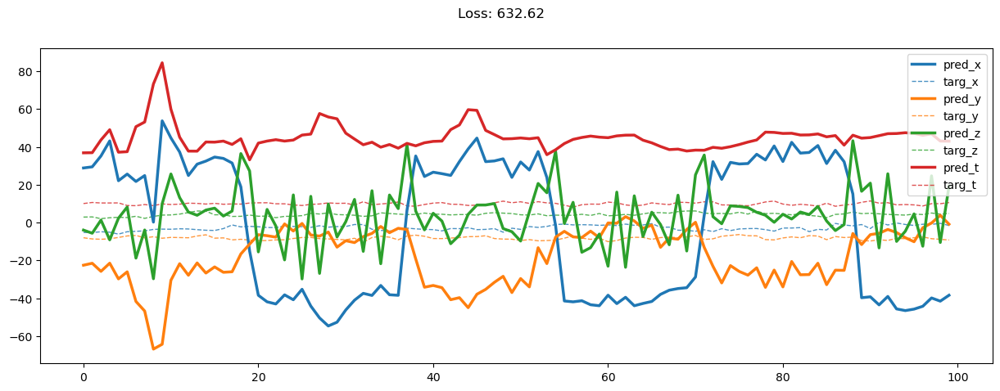

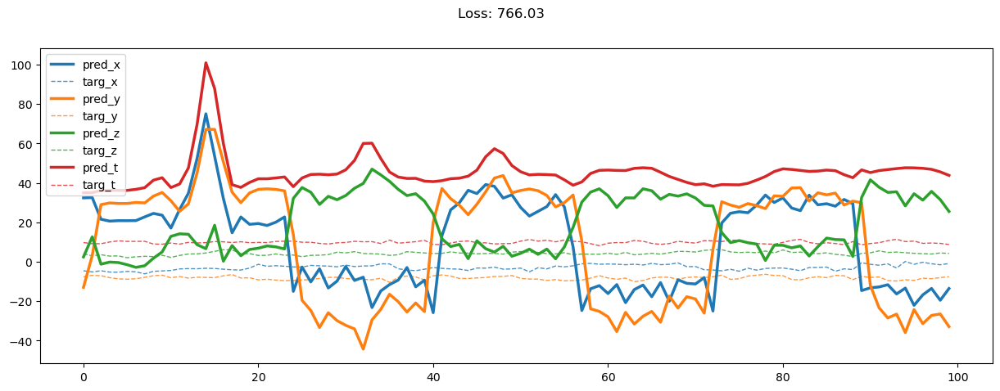

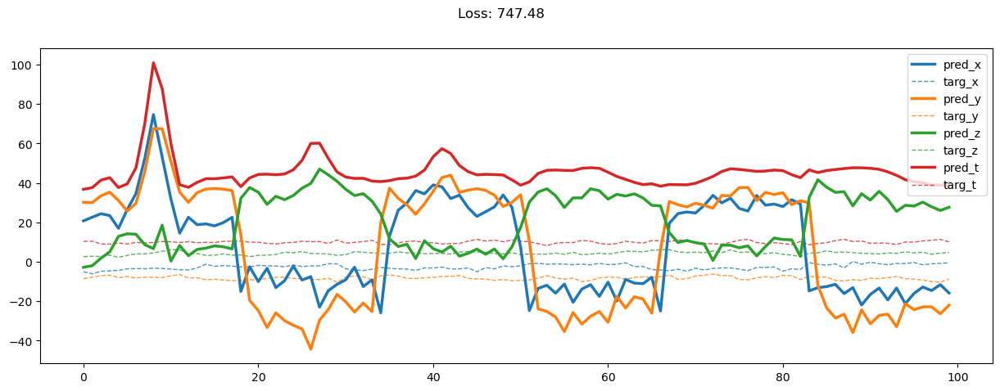

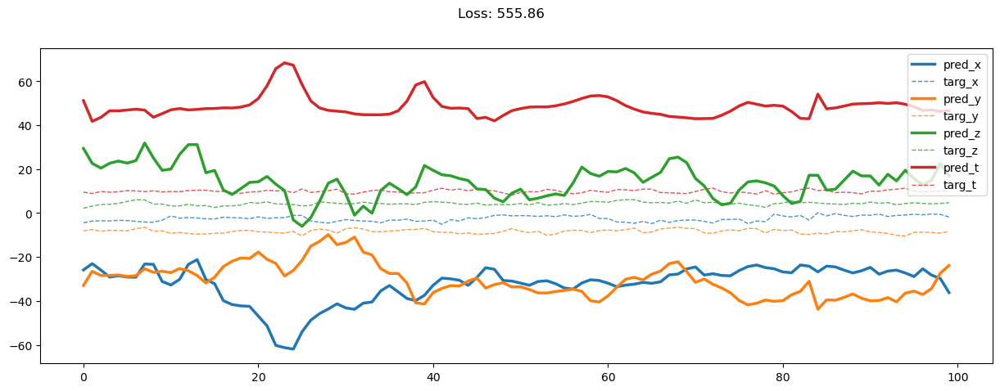

...

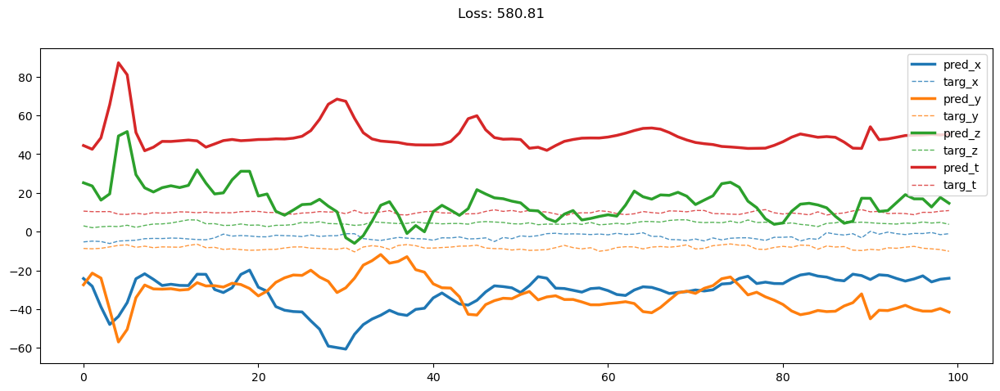

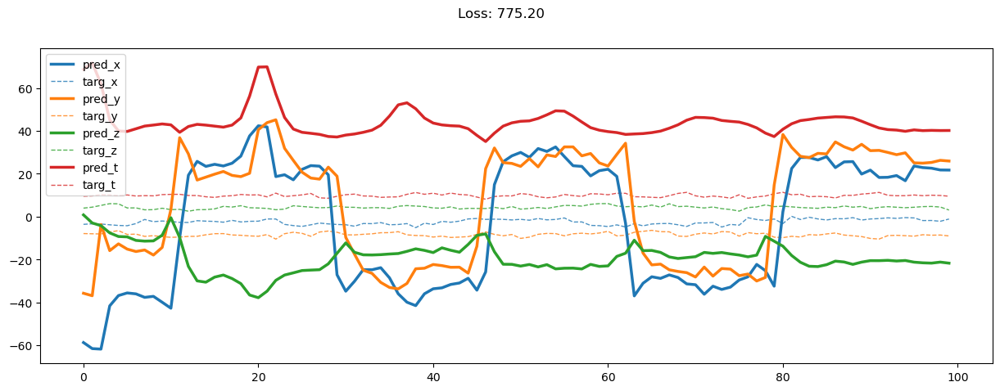

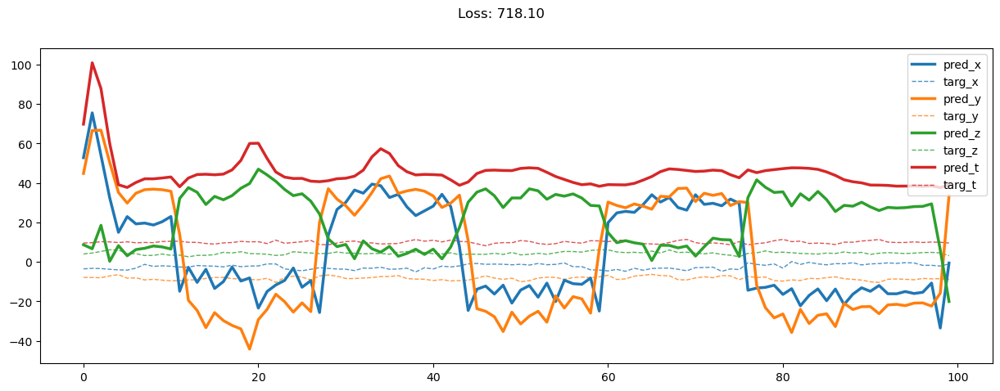

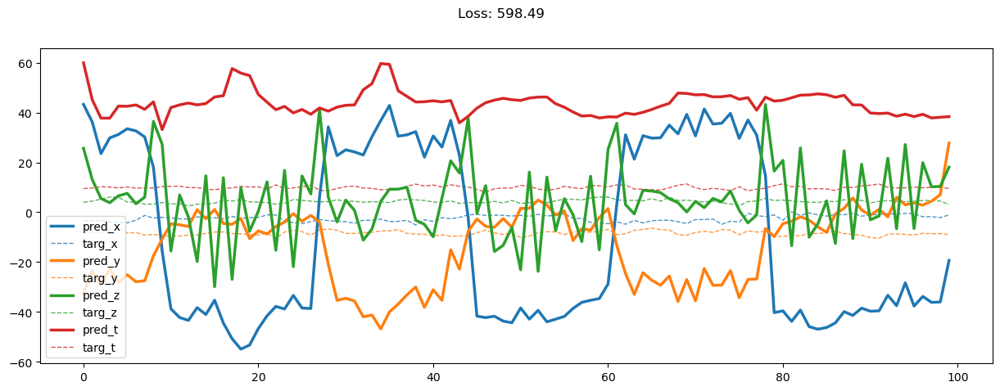

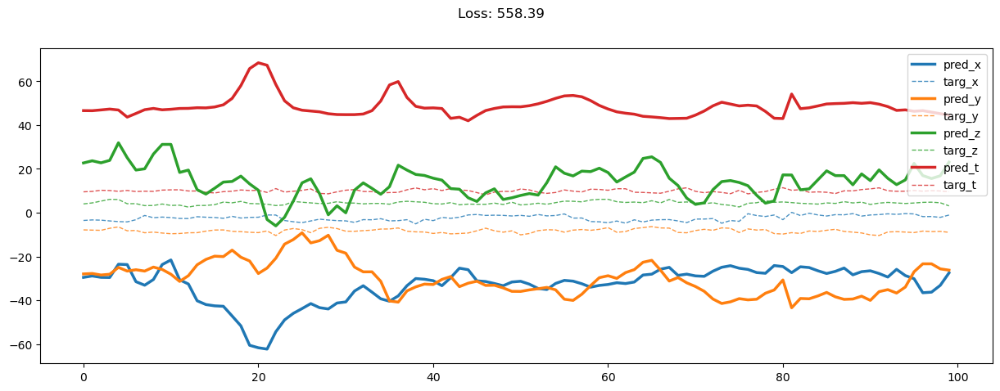

01000: train loss:  0.001
       valid loss:  0.004
01100: train loss:  0.000
       valid loss:  0.003
01200: train loss:  0.000
       valid loss:  0.001
01300: train loss:  0.002
       valid loss:  0.002
01400: train loss:  0.000
       valid loss:  0.001
01500: train loss:  0.000
       valid loss:  0.002
01600: train loss:  0.000
       valid loss:  0.002
01700: train loss:  0.000
       valid loss:  0.001
01800: train loss:  0.000
       valid loss:  0.001
01900: train loss:  0.000
       valid loss:  0.001


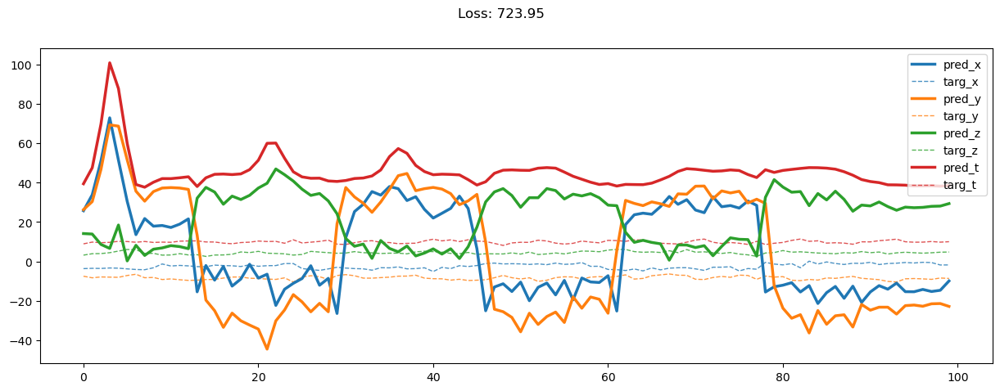

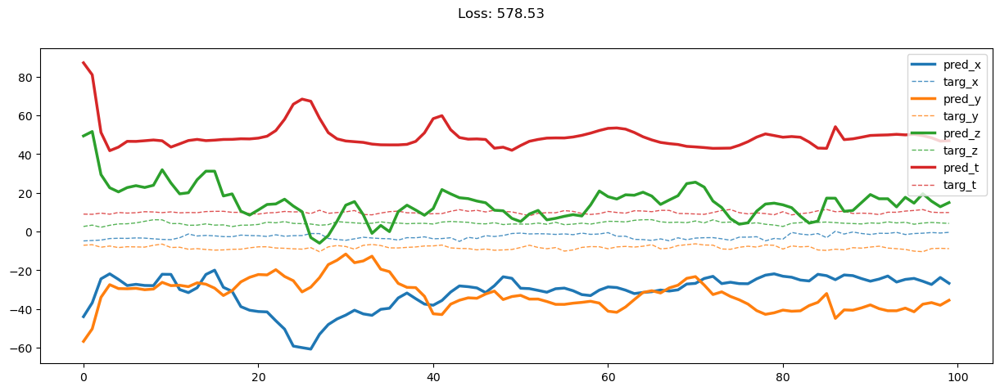

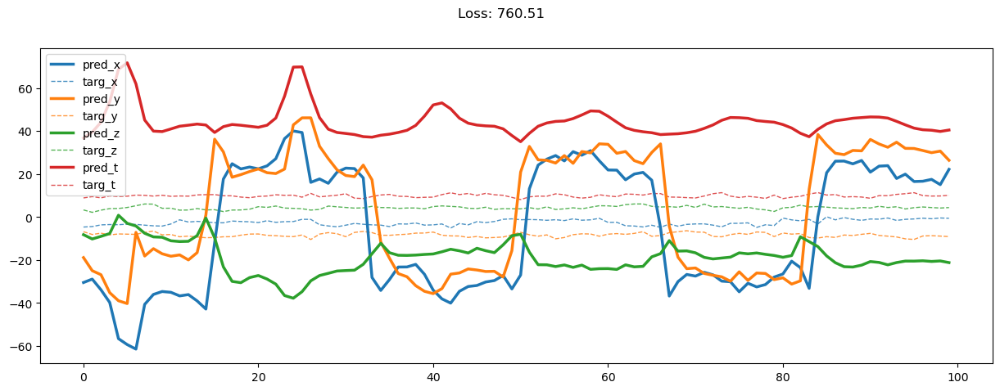

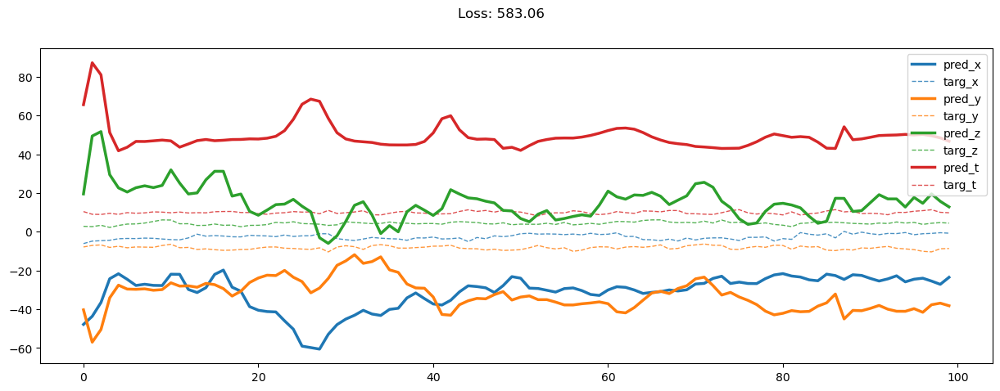

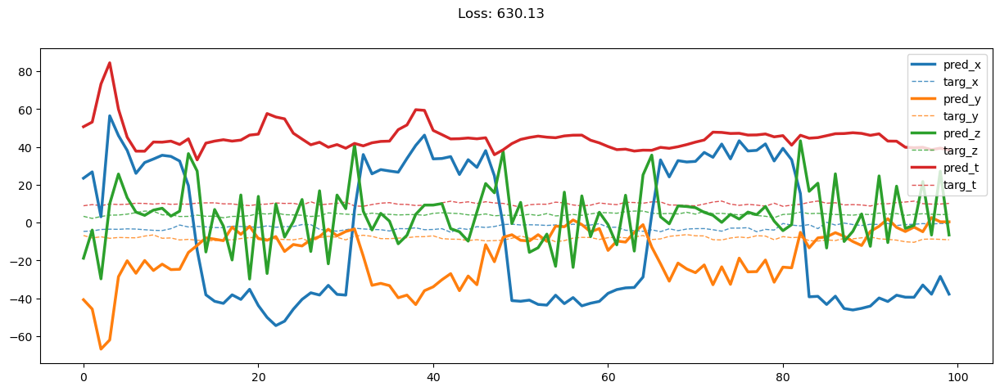

...

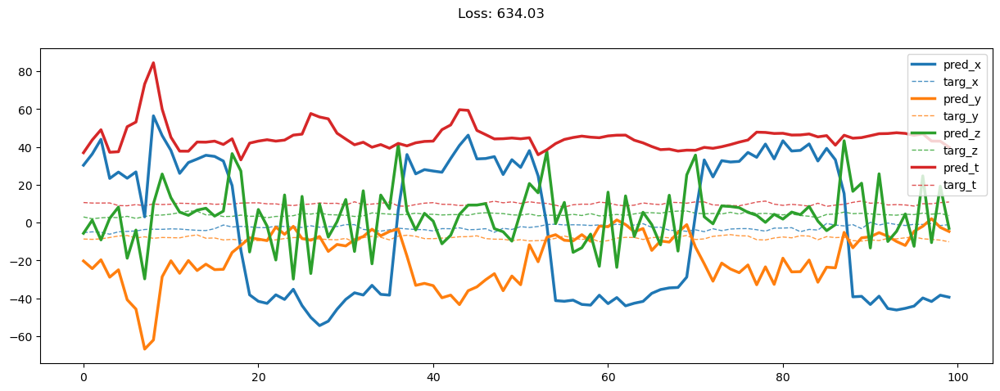

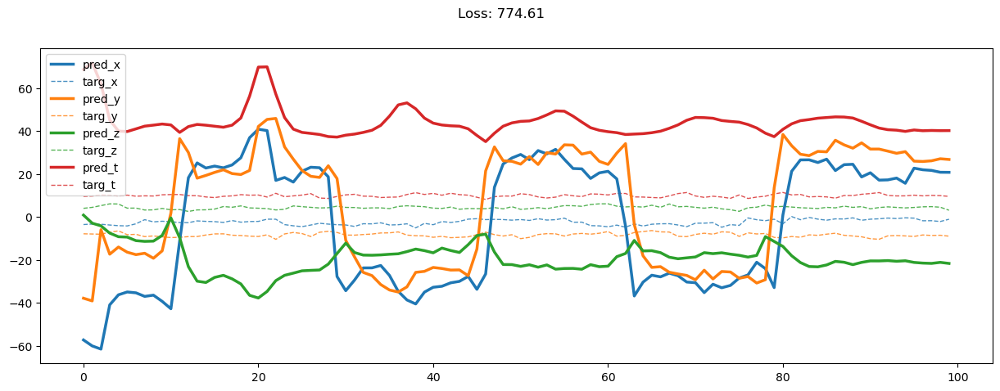

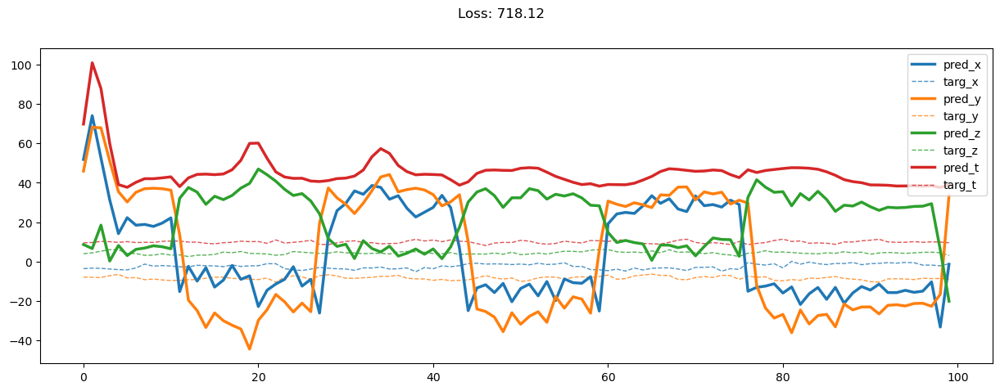

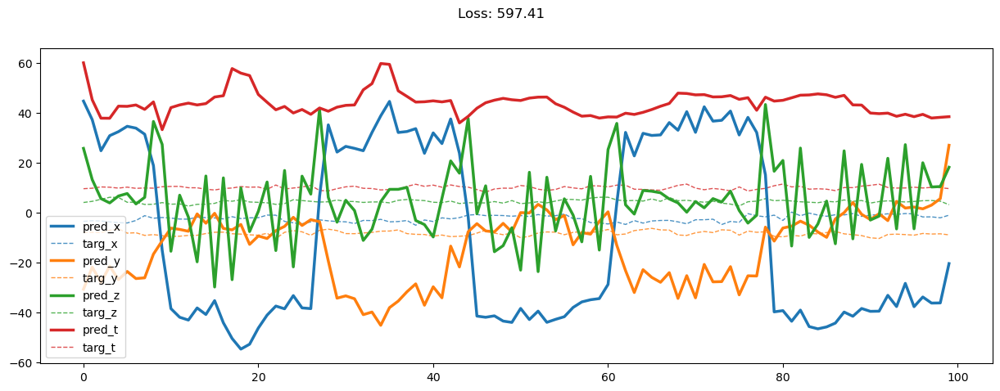

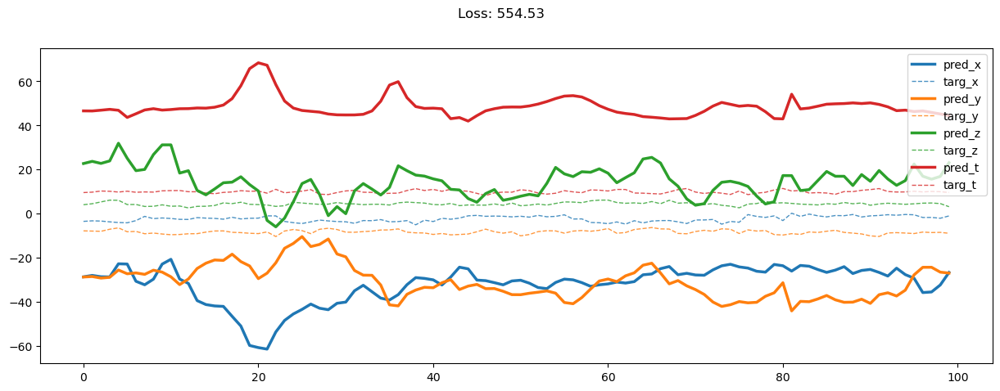

02000: train loss:  0.000
       valid loss:  0.001
02100: train loss:  0.000
       valid loss:  0.001
02200: train loss:  0.000
       valid loss:  0.001
02300: train loss:  0.000
       valid loss:  0.000
02400: train loss:  0.000
       valid loss:  0.000
02500: train loss:  0.000
       valid loss:  0.000
02600: train loss:  0.000
       valid loss:  0.000
02700: train loss:  0.000
       valid loss:  0.000
02800: train loss:  0.000
       valid loss:  0.001
02900: train loss:  0.000
       valid loss:  0.000


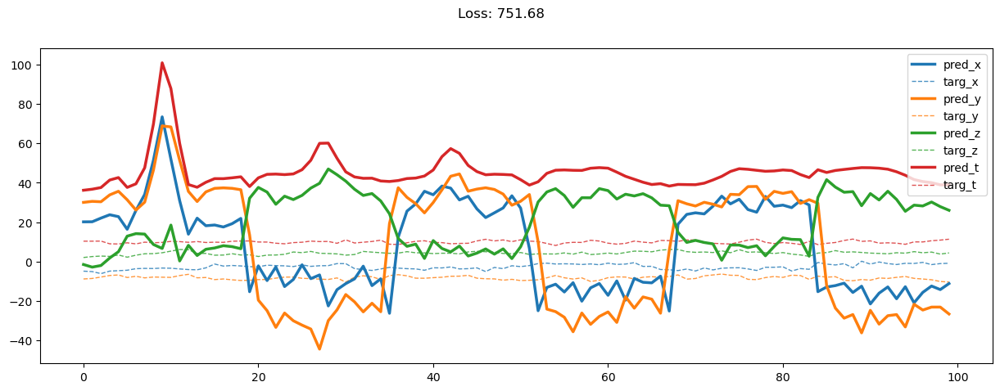

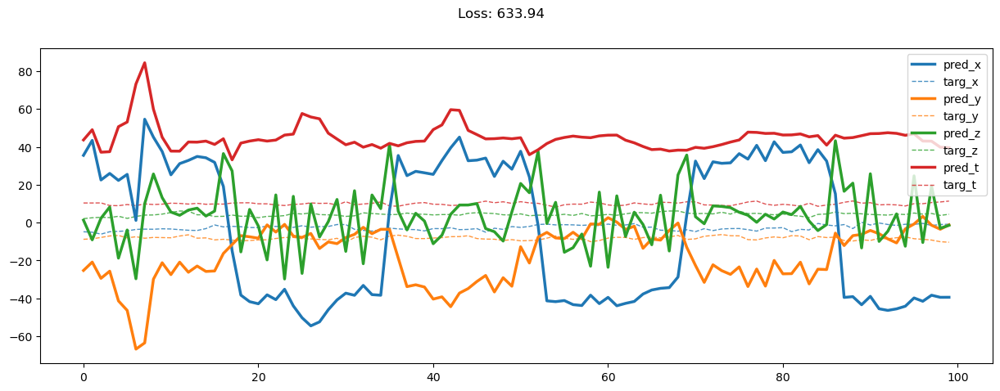

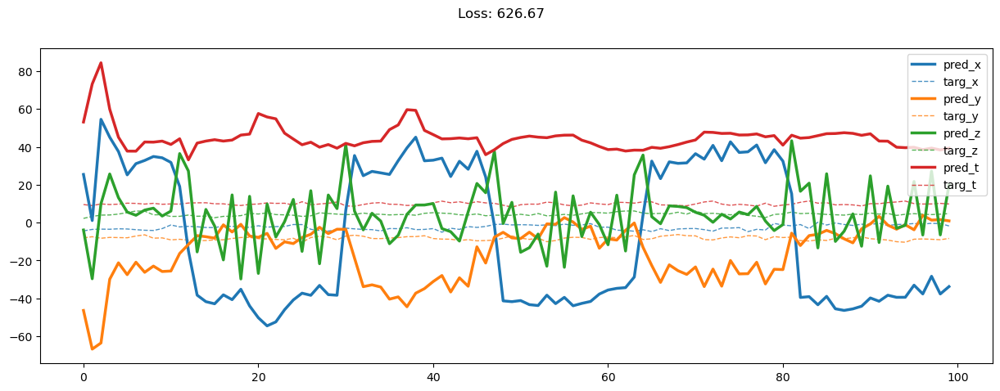

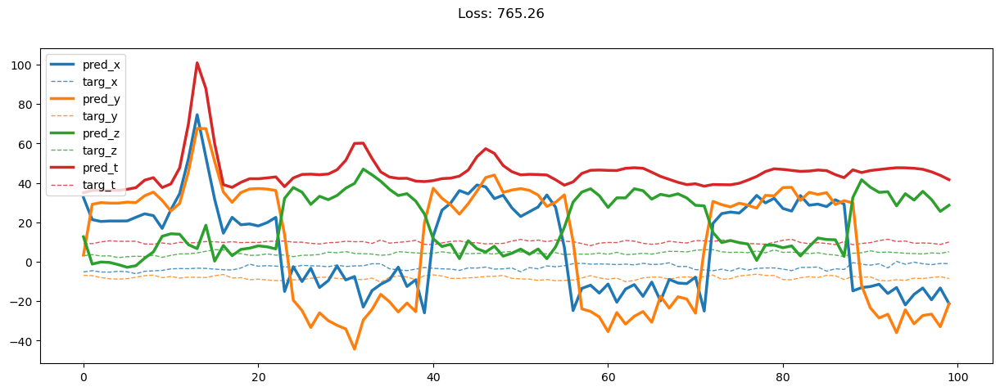

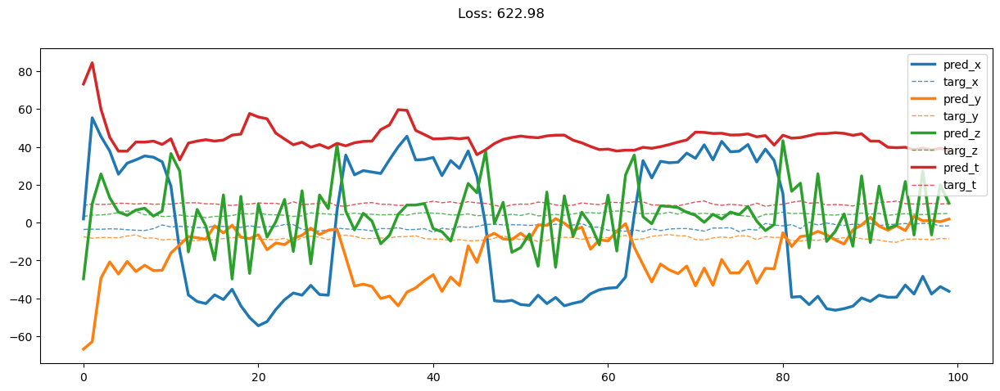

...

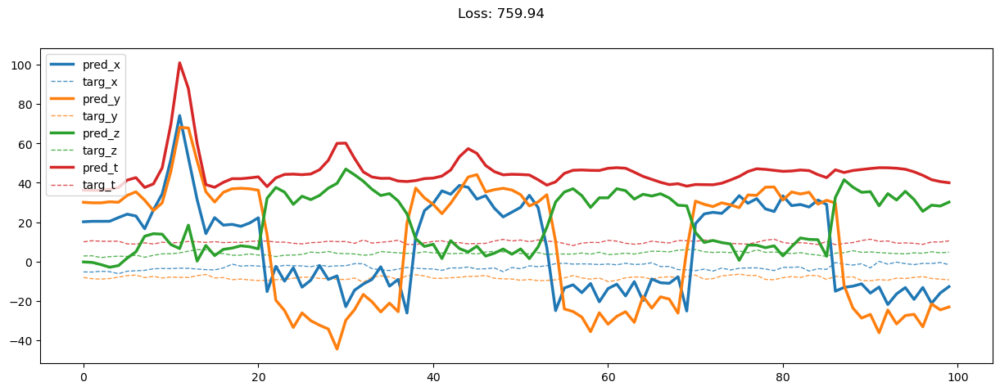

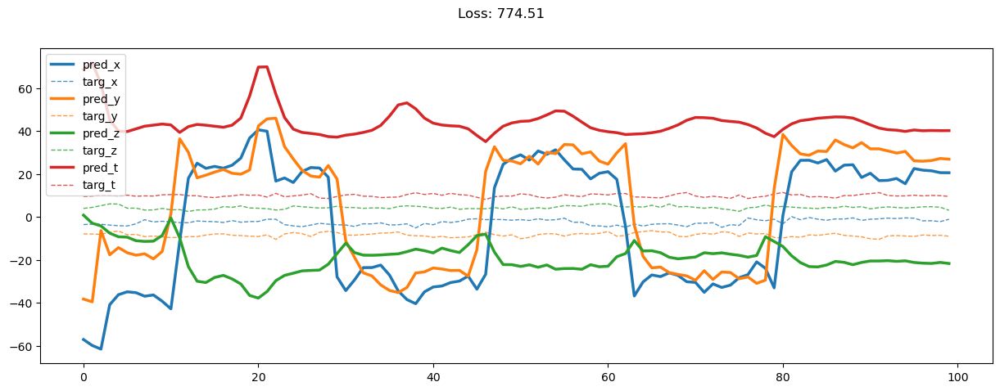

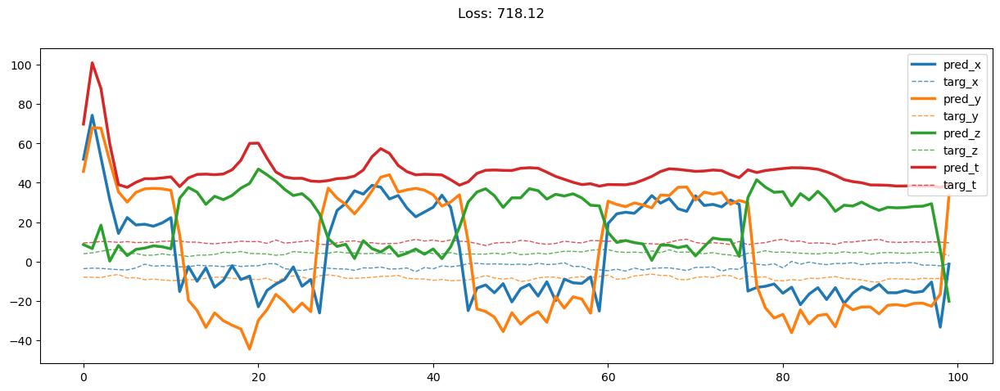

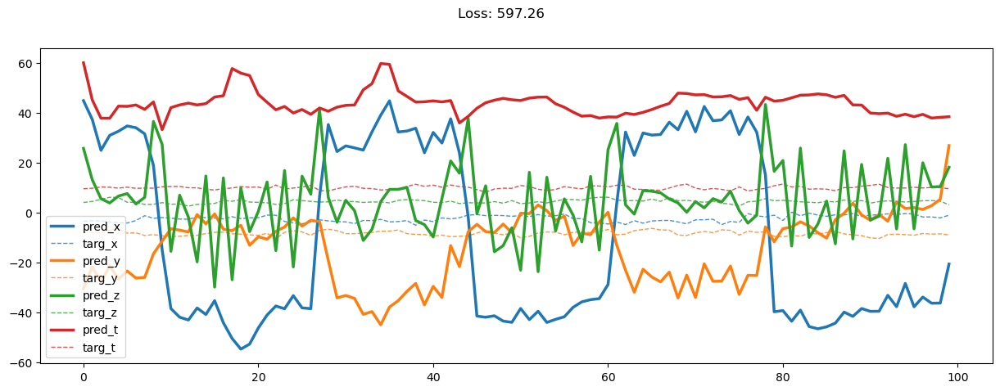

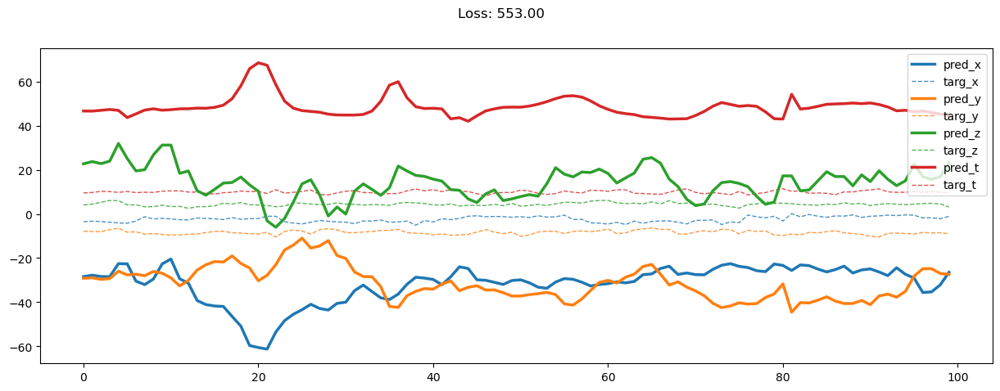

03000: train loss:  0.000
       valid loss:  0.000
03100: train loss:  0.000
       valid loss:  0.001
03200: train loss:  0.000
       valid loss:  0.000
03300: train loss:  0.000
       valid loss:  0.000
03400: train loss:  0.000
       valid loss:  0.000
03500: train loss:  0.000
       valid loss:  0.000
03600: train loss:  0.000
       valid loss:  0.000
03700: train loss:  0.000
       valid loss:  0.000
03800: train loss:  0.000
       valid loss:  0.000
03900: train loss:  0.000
       valid loss:  0.000


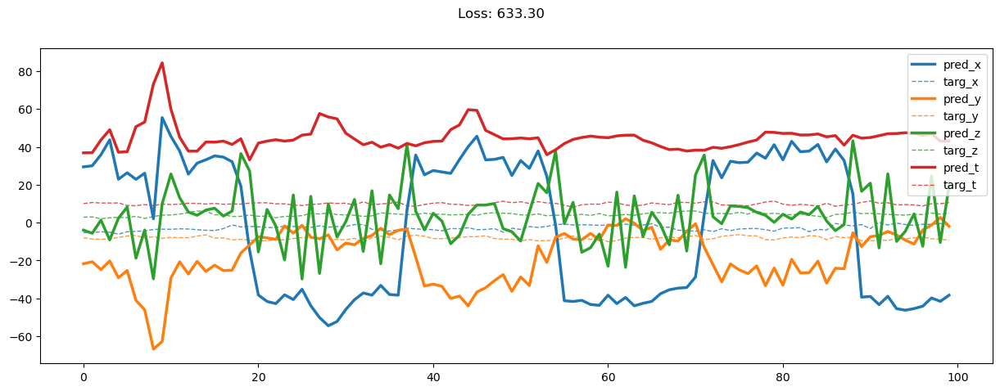

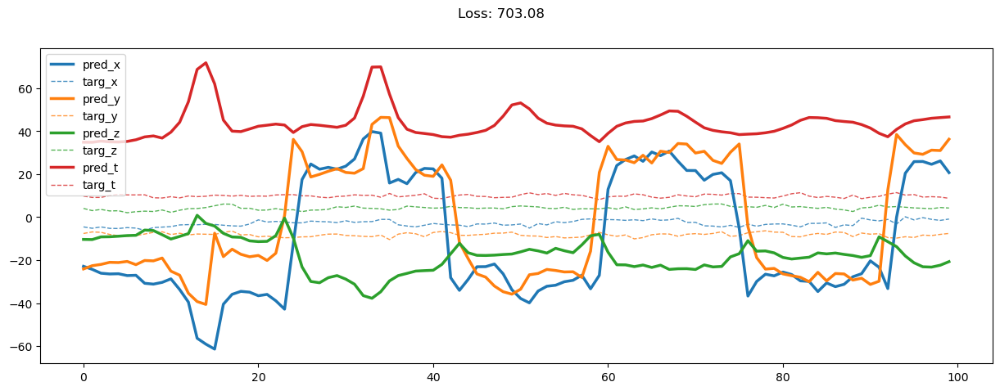

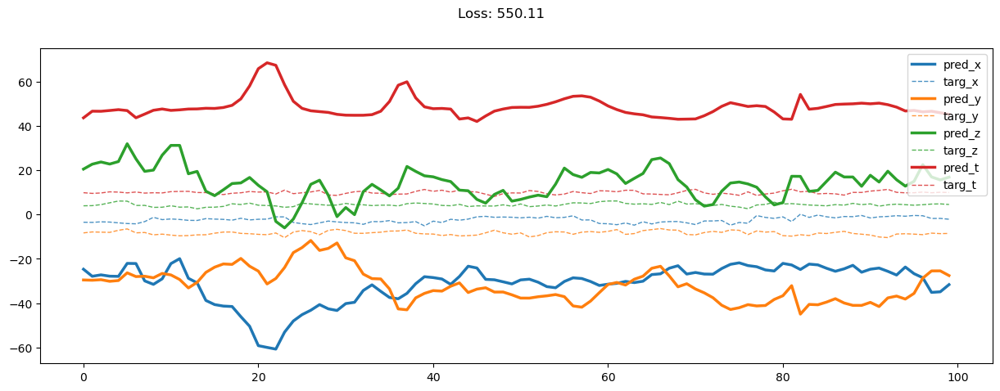

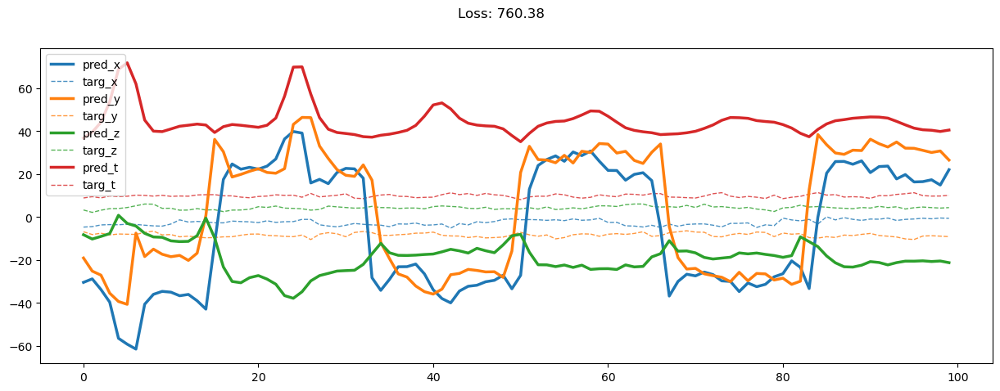

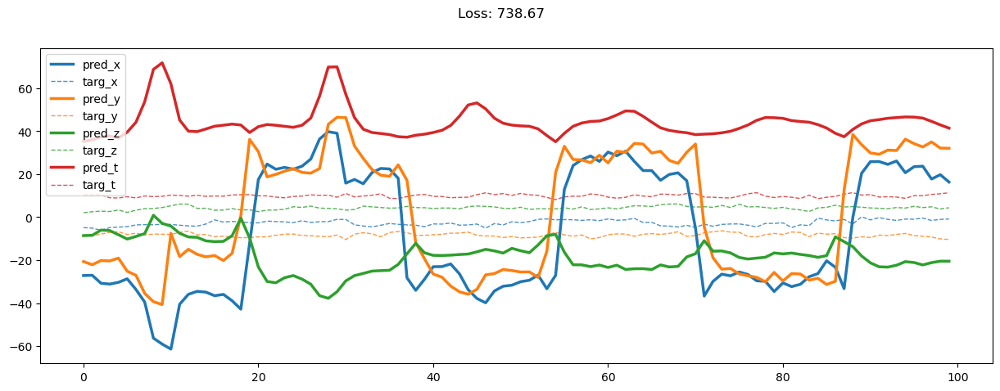

...

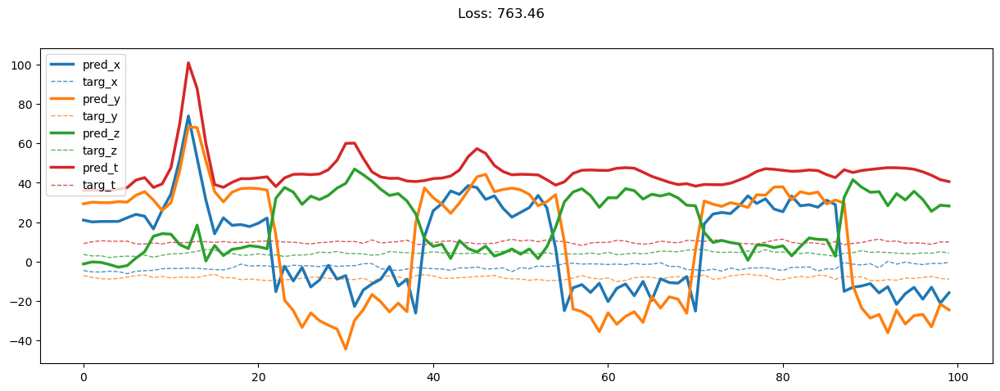

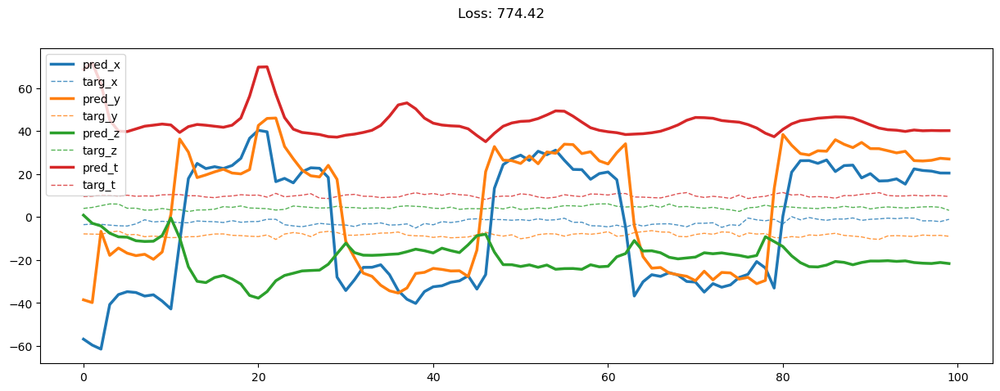

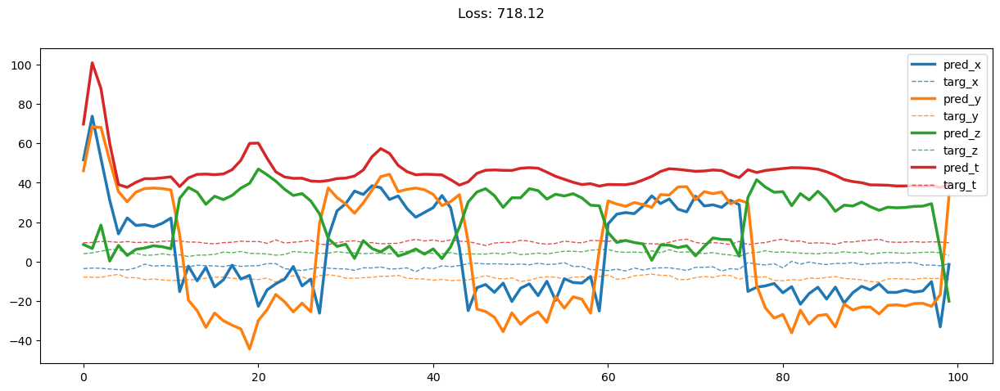

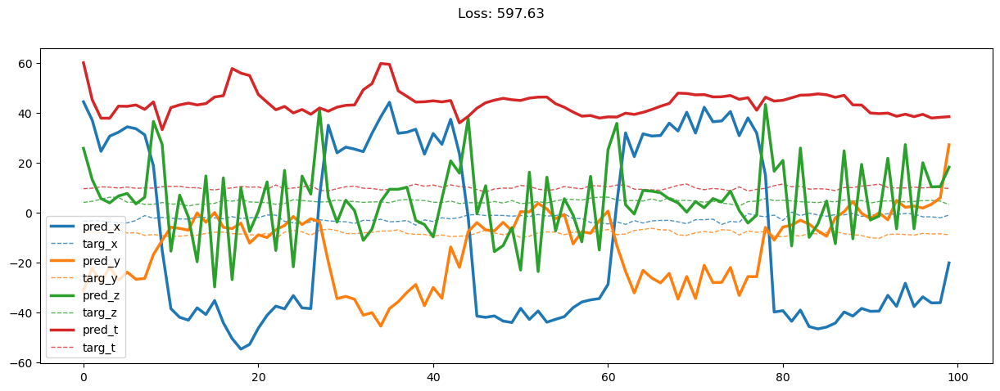

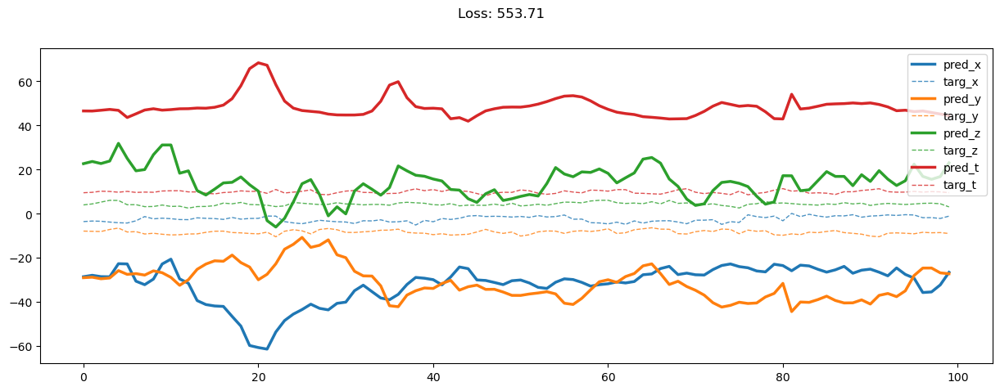

04000: train loss:  0.000
       valid loss:  0.000
04100: train loss:  0.000
       valid loss:  0.000
04200: train loss:  0.000
       valid loss:  0.000


KeyboardInterrupt: 

In [26]:
EPOCH = 10000
draw = False

for epoch in range(EPOCH):
    
    draw = ((epoch) % 1000 == 0)
    
    train_loss = train(train_loader, draw)
    
    if (epoch) % 100 == 0:
        valid_loss = evalute(valid_loader, draw)
        print(f'{epoch:05d}: train loss: {train_loss:>6.3f}\n' +
              f'{"":>5}  valid loss: {valid_loss:>6.3f}')

(1348, 4) (1348, 3) (1348,)
           loss name|   diff x   diff y   diff z      avg
   front_pocket loss:    11.85     9.04     5.52     8.80
     horizontal loss:    23.15    15.37     7.79    15.44
         pocket loss:    15.25     8.50     5.53     9.76
          swing loss:     7.58     5.88     4.33     5.93
        average loss:    14.46     9.70     5.79     9.98


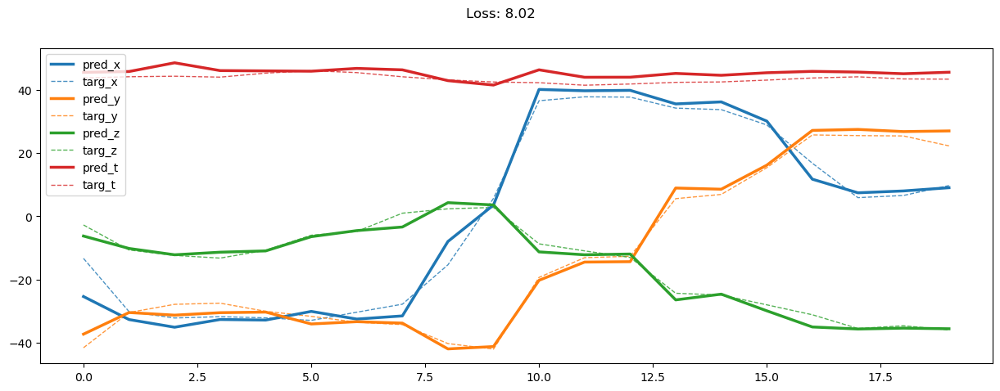

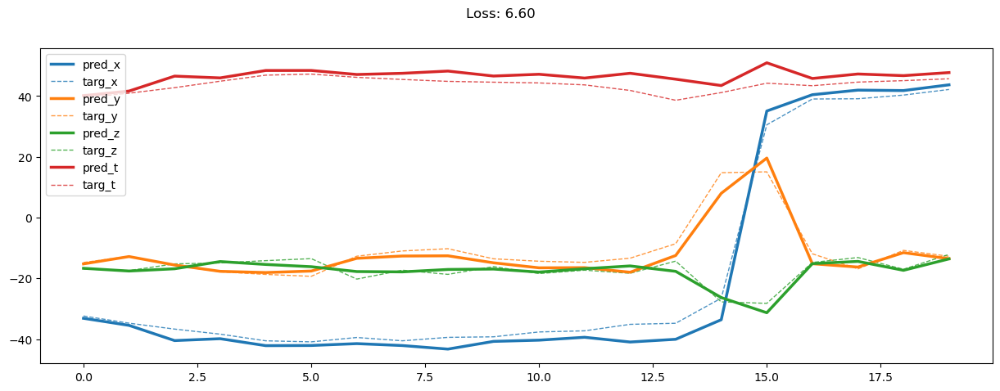

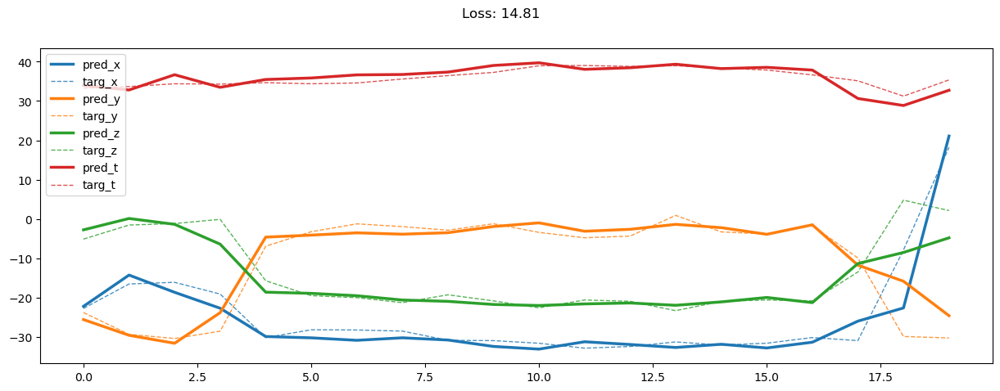

In [30]:
show_result(model, train_loader)

(1348, 4) (1348, 3) (1348,)
           loss name|   diff x   diff y   diff z      avg
   front_pocket loss:    14.47    10.03     6.01    10.17
     horizontal loss:    27.76    17.00     8.23    17.66
         pocket loss:    19.96     9.52     5.89    11.79
          swing loss:     9.05     6.32     4.69     6.69
        average loss:    17.81    10.72     6.20    11.58


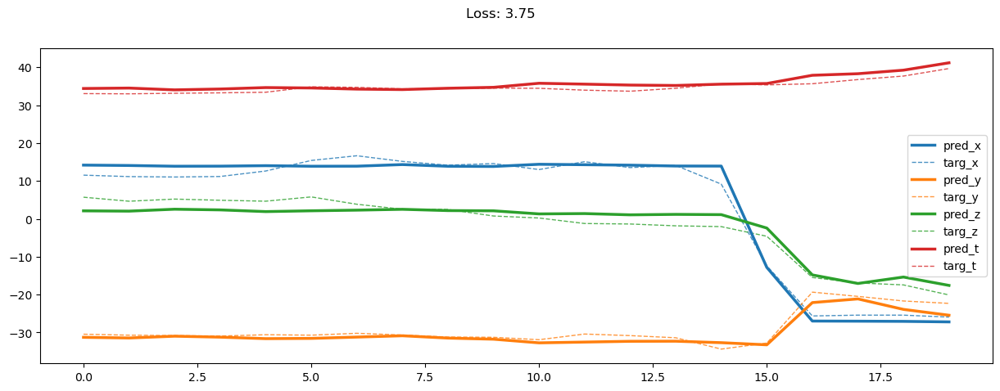

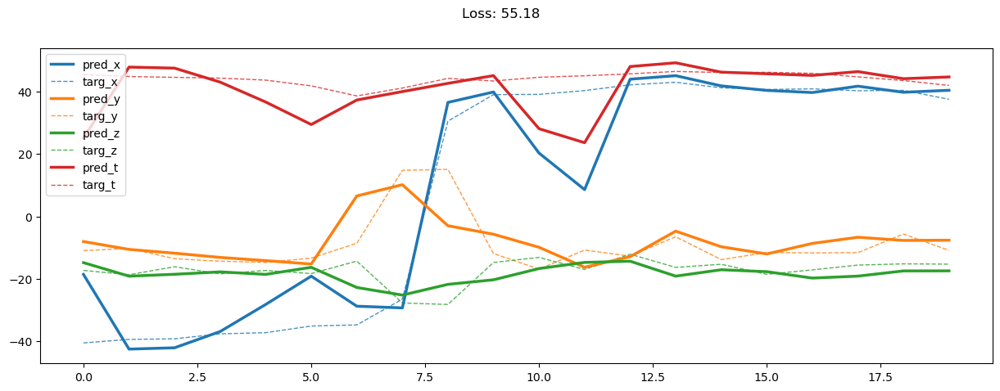

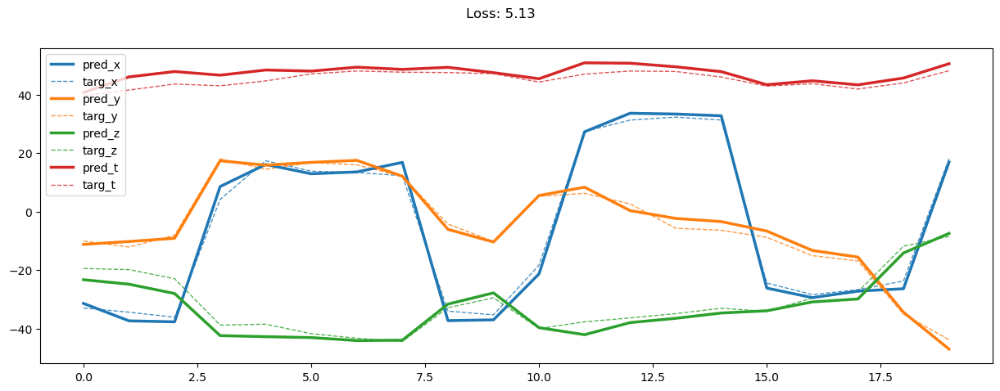

In [31]:
show_result(model, valid_loader)

In [32]:
model.cpu()
del model, optimizer, train_loader, valid_loader, train_dataset, valid_dataset
gc.collect()
torch.cuda.empty_cache()

In [33]:
gt = 'horizontal'

classes, train_dataset, valid_dataset = for_dataloaders(prep_valid_traj, gt)
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=64, shuffle=False)

model = NotSimpleTransformer(seq_len=seq_len, num_of_classes=num_of_classes).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.00005)

{1: 'front_pocket', 0: 'horizontal', 2: 'pocket', 3: 'swing', 4: 'target'}


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 19999/20000 [2:39:10<00:00,  1.77it/s]

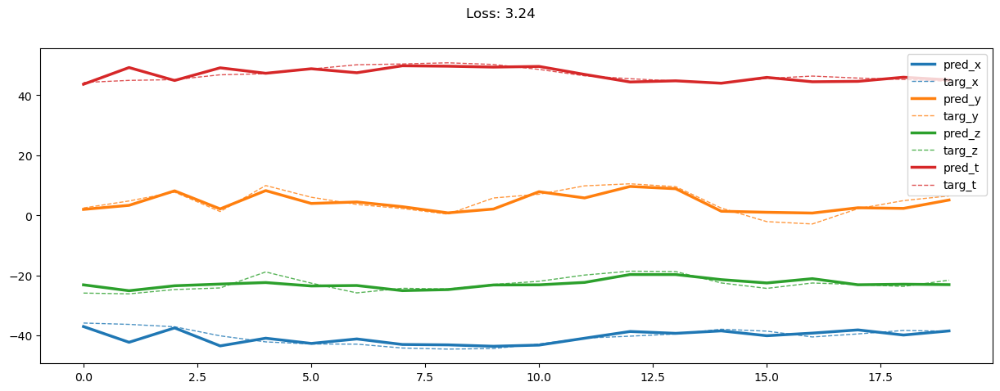

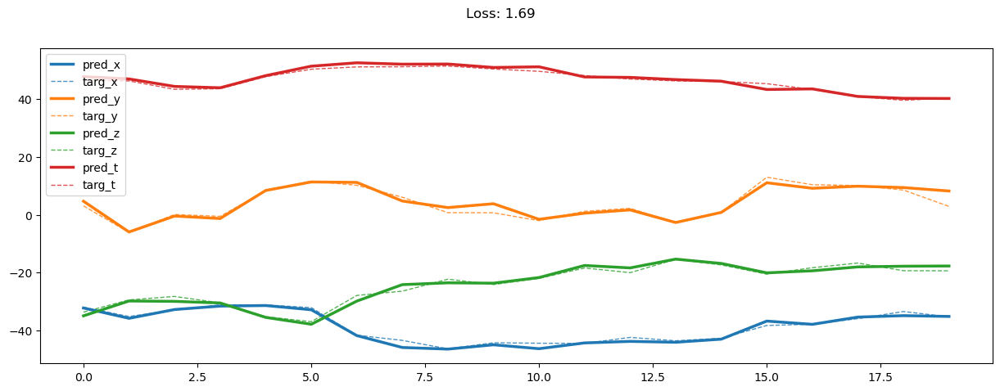

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20000/20000 [2:39:11<00:00,  2.09it/s]

19999: train loss: 18.759, imu loss:  0.436, mag loss:  5.496, div loss: 10.919, slim:  3.734, tlim:  1.299
       valid loss: 10.163, imu loss:  0.386, mag loss:  2.831, div loss:  5.259, slim:  4.040, tlim:  0.903


In [34]:
EPOCH = 20000
draw = False

for epoch in tqdm(range(EPOCH)):
    #####
    # 1. 用上半部訓練50epoch
    # 2. 隨機用上或下半部訓練Model
    # 3. 印出trajectory結果
    #####
    
    draw = ((epoch + 1) % 20000 == 0)
    
    train_loss, train_imu_loss, train_mag_loss, t_d1_loss, tlim_loss = train(train_loader, draw)
    
    if (epoch + 1) % 20000 == 0:
        valid_loss, valid_imu_loss, valid_mag_loss, v_d1_loss, vlim_loss = evalute(valid_loader, draw)
        print(f'{epoch:05d}: train loss: {train_loss:>6.3f}, imu loss: {train_imu_loss:>6.3f}, mag loss: {train_mag_loss:>6.3f}, div loss: {t_d1_loss:>6.3f}, slim: {tlim_loss[0]:>6.3f}, tlim: {tlim_loss[1]:>6.3f}\n' +
              f'{"":>5}  valid loss: {valid_loss:>6.3f}, imu loss: {valid_imu_loss:>6.3f}, mag loss: {valid_mag_loss:>6.3f}, div loss: {v_d1_loss:>6.3f}, slim: {vlim_loss[0]:>6.3f}, tlim: {vlim_loss[1]:>6.3f}')

(1348, 4) (1348, 3) (1348,)
           loss name|   diff x   diff y   diff z      avg
   front_pocket loss:     2.44     4.64     2.15     3.07
         pocket loss:     2.03     3.81     1.92     2.59
          swing loss:     1.79     2.63     1.40     1.94
         target loss:     2.37     5.30     2.08     3.25
        average loss:     2.16     4.09     1.89     2.71


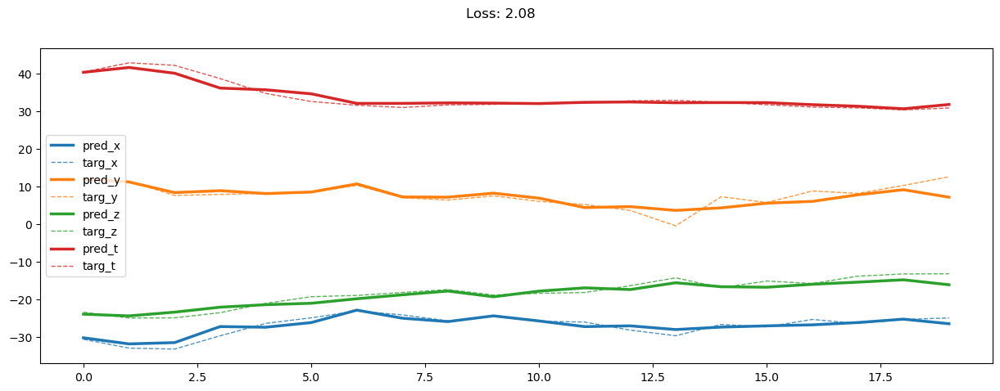

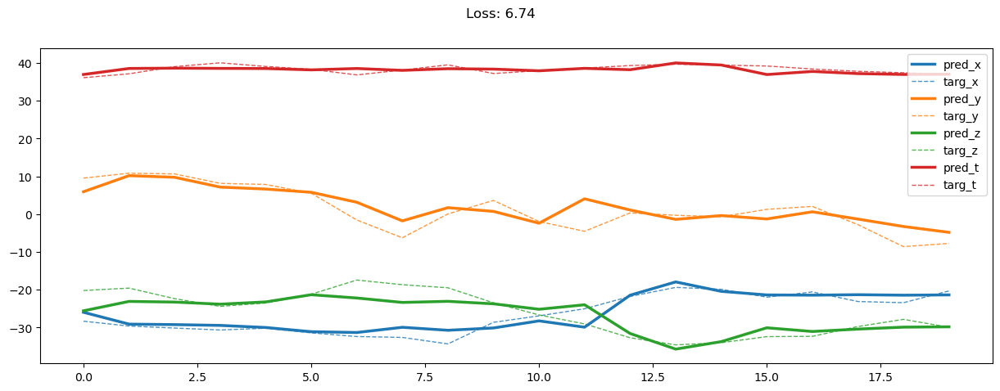

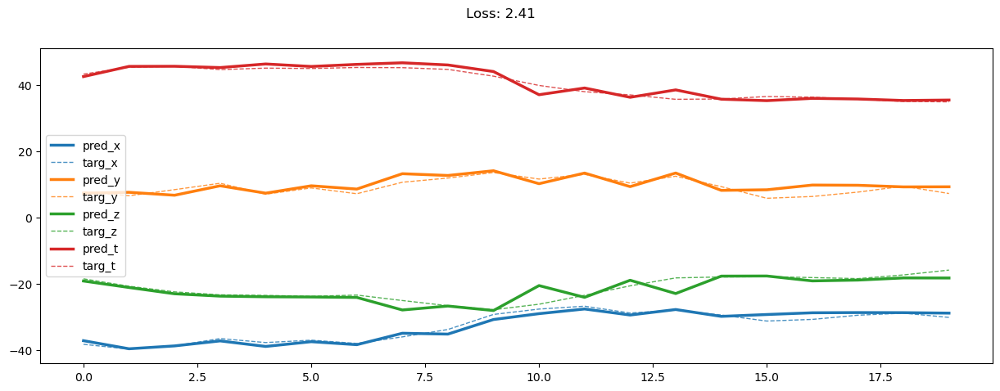

In [35]:
show_result(model, train_loader)

(1348, 4) (1348, 3) (1348,)
           loss name|   diff x   diff y   diff z      avg
   front_pocket loss:     2.57     4.70     2.20     3.15
         pocket loss:     2.30     4.26     2.20     2.92
          swing loss:     1.90     2.70     1.52     2.04
         target loss:     2.39     5.39     2.13     3.30
        average loss:     2.29     4.26     2.01     2.85


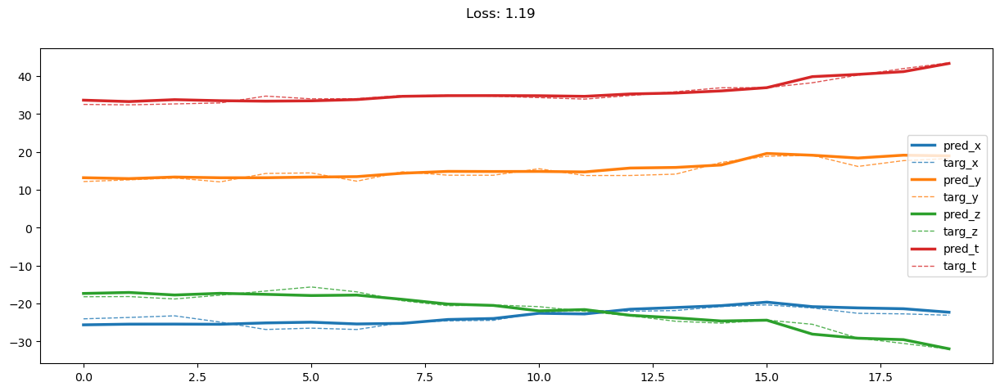

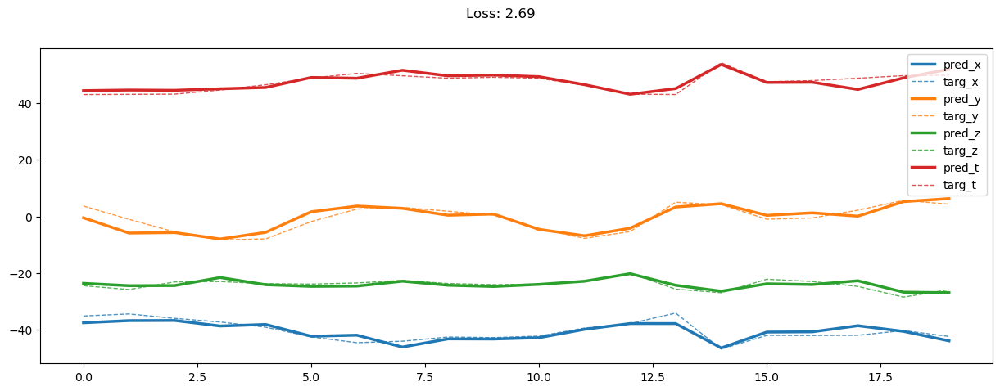

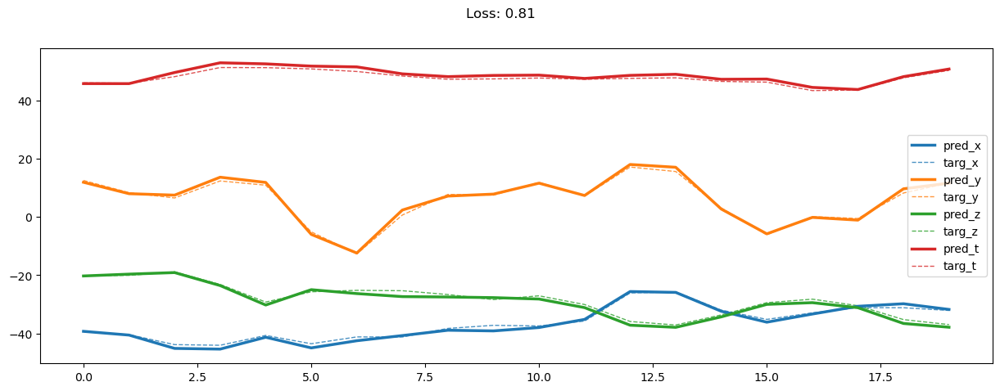

In [36]:
show_result(model, valid_loader)

In [37]:
model.cpu()
del model, optimizer, train_loader, valid_loader, train_dataset, valid_dataset
gc.collect()
torch.cuda.empty_cache()

In [38]:
gt = 'front_pocket'

classes, train_dataset, valid_dataset = for_dataloaders(prep_valid_traj, gt)
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=64, shuffle=False)

model = NotSimpleTransformer(seq_len=seq_len, num_of_classes=num_of_classes).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.00005)

{0: 'front_pocket', 1: 'horizontal', 2: 'pocket', 3: 'swing', 4: 'target'}


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 19999/20000 [2:35:42<00:00,  1.76it/s]

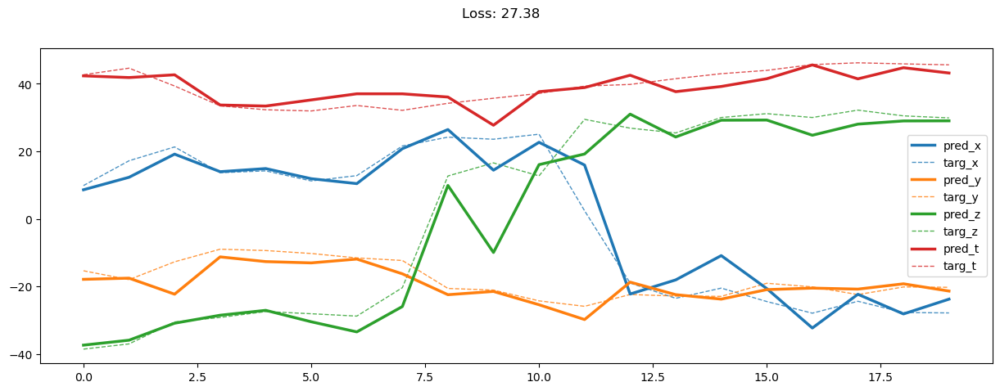

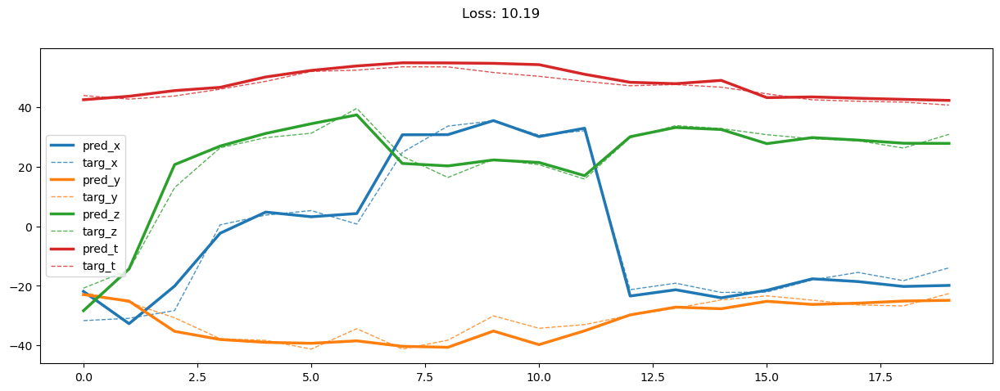

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20000/20000 [2:35:43<00:00,  2.14it/s]

19999: train loss: 76.020, imu loss:  0.576, mag loss: 24.180, div loss: 48.510, slim:  4.124, tlim:  2.298
       valid loss: 33.313, imu loss:  0.536, mag loss: 10.610, div loss: 19.965, slim:  3.689, tlim:  1.707


In [39]:
EPOCH = 20000
draw = False

for epoch in tqdm(range(EPOCH)):
    #####
    # 1. 用上半部訓練50epoch
    # 2. 隨機用上或下半部訓練Model
    # 3. 印出trajectory結果
    #####
    
    draw = ((epoch + 1) % 20000 == 0)
    
    train_loss, train_imu_loss, train_mag_loss, t_d1_loss, tlim_loss = train(train_loader, draw)
    
    if (epoch + 1) % 20000 == 0:
        valid_loss, valid_imu_loss, valid_mag_loss, v_d1_loss, vlim_loss = evalute(valid_loader, draw)
        print(f'{epoch:05d}: train loss: {train_loss:>6.3f}, imu loss: {train_imu_loss:>6.3f}, mag loss: {train_mag_loss:>6.3f}, div loss: {t_d1_loss:>6.3f}, slim: {tlim_loss[0]:>6.3f}, tlim: {tlim_loss[1]:>6.3f}\n' +
              f'{"":>5}  valid loss: {valid_loss:>6.3f}, imu loss: {valid_imu_loss:>6.3f}, mag loss: {valid_mag_loss:>6.3f}, div loss: {v_d1_loss:>6.3f}, slim: {vlim_loss[0]:>6.3f}, tlim: {vlim_loss[1]:>6.3f}')

(1348, 4) (1348, 3) (1348,)
           loss name|   diff x   diff y   diff z      avg
     horizontal loss:    19.48     4.10    18.08    13.89
         pocket loss:    11.62     3.36     8.69     7.89
          swing loss:     6.25     3.29     6.91     5.48
         target loss:    21.59     3.31    12.34    12.41
        average loss:    14.74     3.52    11.50     9.92


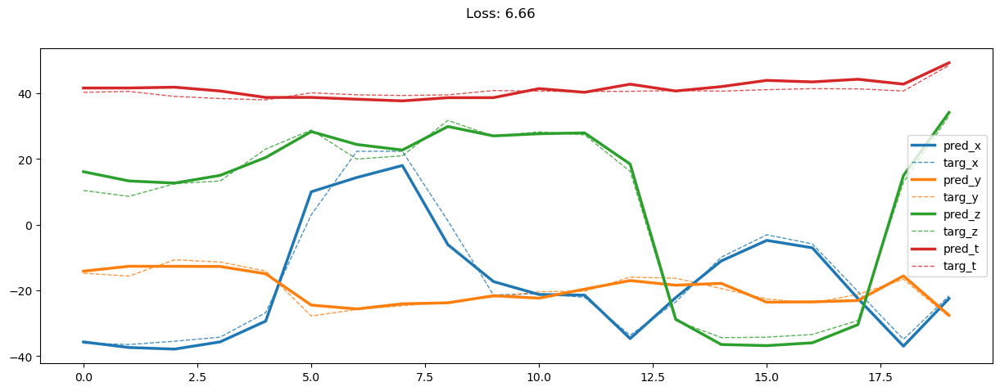

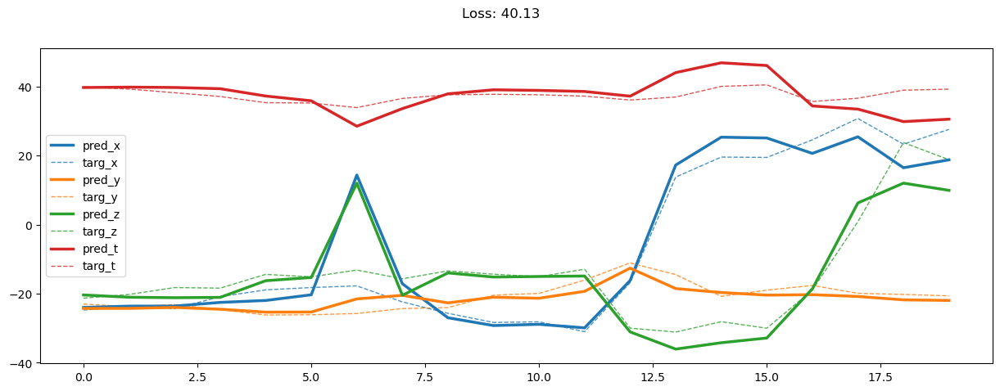

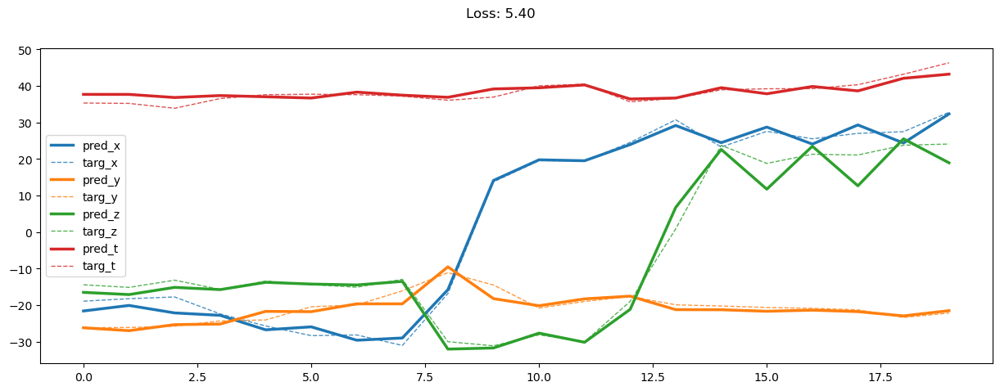

In [40]:
show_result(model, train_loader)

(1348, 4) (1348, 3) (1348,)
           loss name|   diff x   diff y   diff z      avg
     horizontal loss:    22.64     4.00    19.33    15.33
         pocket loss:    14.03     3.62     9.60     9.08
          swing loss:     6.72     3.23     7.17     5.71
         target loss:    22.83     3.17    12.57    12.86
        average loss:    16.56     3.50    12.17    10.74


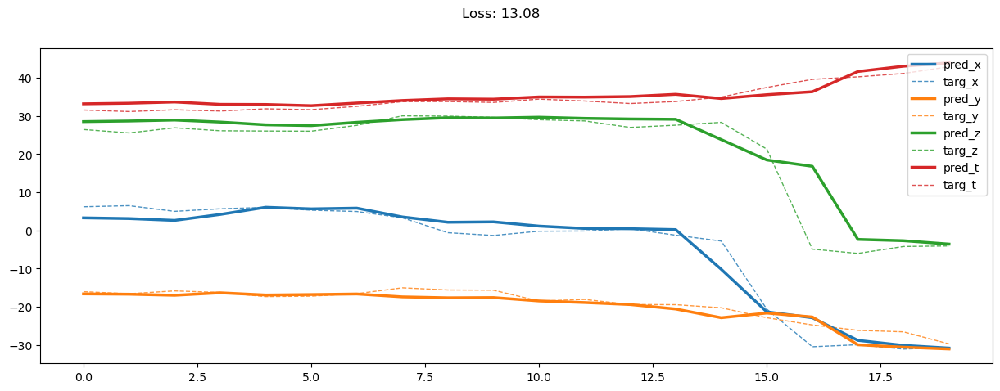

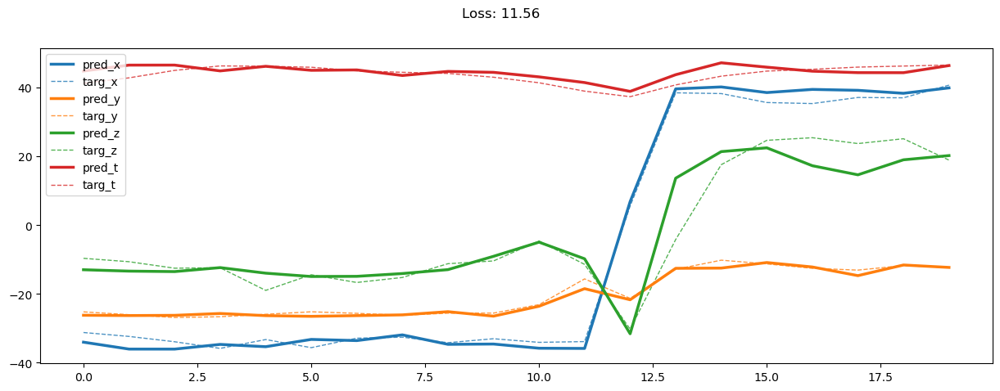

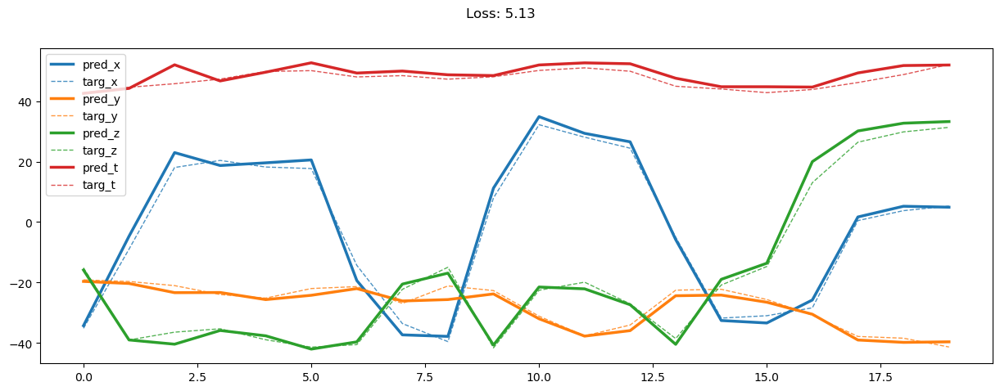

In [41]:
show_result(model, valid_loader)

In [42]:
model.cpu()
del model, optimizer, train_loader, valid_loader, train_dataset, valid_dataset
gc.collect()
torch.cuda.empty_cache()

In [43]:
gt = 'pocket'

classes, train_dataset, valid_dataset = for_dataloaders(prep_valid_traj, gt)
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=64, shuffle=False)

model = NotSimpleTransformer(seq_len=seq_len, num_of_classes=num_of_classes).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.00005)

{1: 'front_pocket', 2: 'horizontal', 0: 'pocket', 3: 'swing', 4: 'target'}


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 19999/20000 [2:30:13<00:00,  4.58it/s]

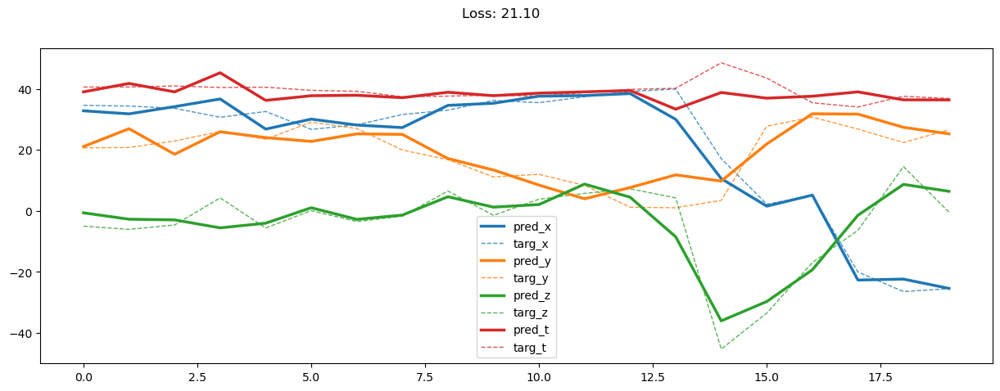

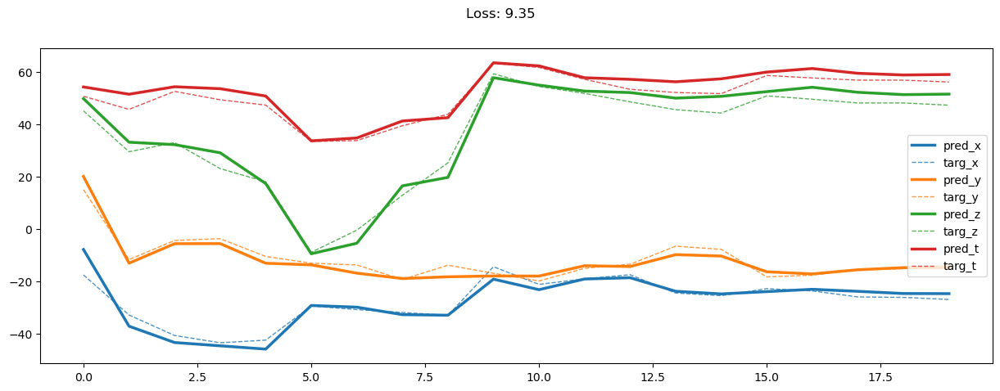

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20000/20000 [2:30:14<00:00,  2.22it/s]

19999: train loss: 103.335, imu loss:  2.101, mag loss: 32.762, div loss: 65.132, slim:  5.065, tlim:  2.764
       valid loss: 57.971, imu loss:  1.935, mag loss: 18.872, div loss: 34.114, slim:  5.478, tlim:  2.241


In [44]:
EPOCH = 20000
draw = False

for epoch in tqdm(range(EPOCH)):
    #####
    # 1. 用上半部訓練50epoch
    # 2. 隨機用上或下半部訓練Model
    # 3. 印出trajectory結果
    #####
    
    draw = ((epoch + 1) % 20000 == 0)
    
    train_loss, train_imu_loss, train_mag_loss, t_d1_loss, tlim_loss = train(train_loader, draw)
    
    if (epoch + 1) % 20000 == 0:
        valid_loss, valid_imu_loss, valid_mag_loss, v_d1_loss, vlim_loss = evalute(valid_loader, draw)
        print(f'{epoch:05d}: train loss: {train_loss:>6.3f}, imu loss: {train_imu_loss:>6.3f}, mag loss: {train_mag_loss:>6.3f}, div loss: {t_d1_loss:>6.3f}, slim: {tlim_loss[0]:>6.3f}, tlim: {tlim_loss[1]:>6.3f}\n' +
              f'{"":>5}  valid loss: {valid_loss:>6.3f}, imu loss: {valid_imu_loss:>6.3f}, mag loss: {valid_mag_loss:>6.3f}, div loss: {v_d1_loss:>6.3f}, slim: {vlim_loss[0]:>6.3f}, tlim: {vlim_loss[1]:>6.3f}')

(1348, 4) (1348, 3) (1348,)
           loss name|   diff x   diff y   diff z      avg
   front_pocket loss:    18.05    12.88    18.84    16.59
     horizontal loss:    32.22    13.80    22.44    22.82
          swing loss:     8.69     7.06     9.48     8.41
         target loss:    26.05    13.27    21.97    20.43
        average loss:    21.25    11.75    18.18    17.06


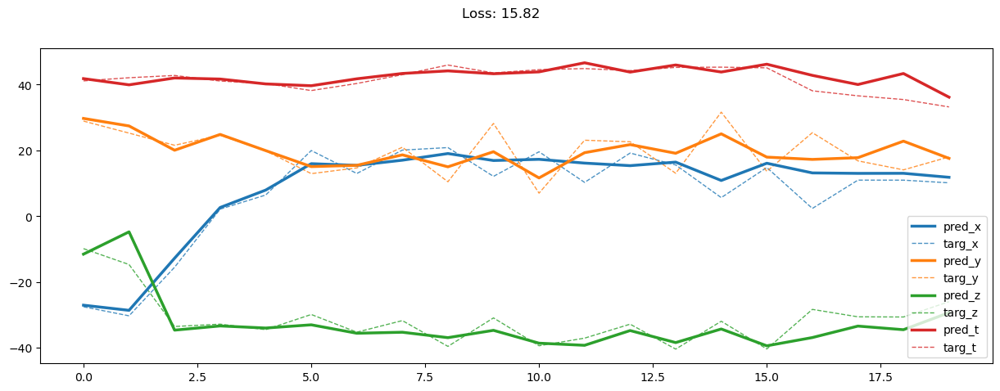

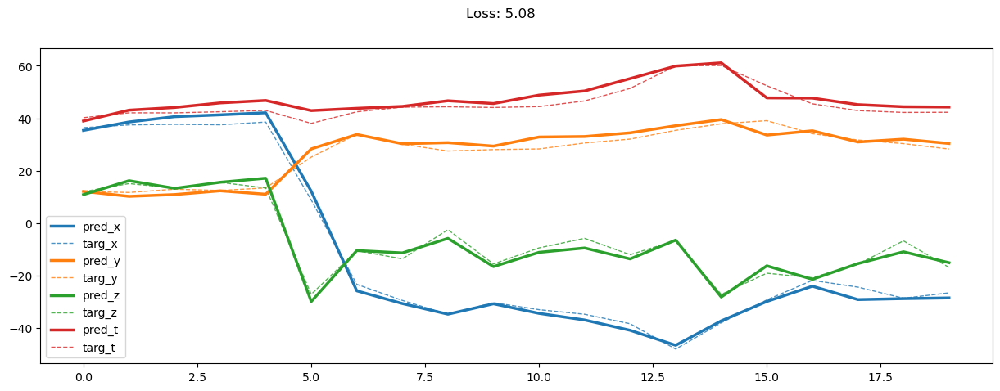

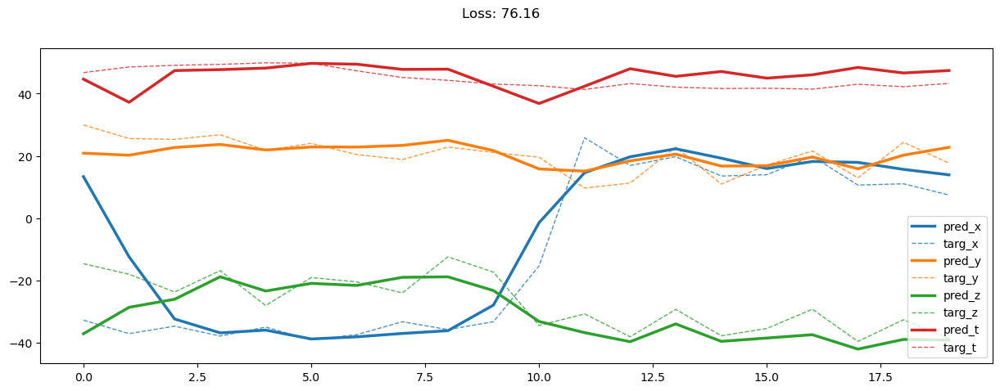

In [45]:
show_result(model, train_loader)

(1348, 4) (1348, 3) (1348,)
           loss name|   diff x   diff y   diff z      avg
   front_pocket loss:    19.90    13.77    20.30    17.99
     horizontal loss:    35.04    14.62    25.47    25.04
          swing loss:    10.38     8.16    10.96     9.83
         target loss:    27.85    13.68    23.11    21.55
        average loss:    23.29    12.56    19.96    18.60


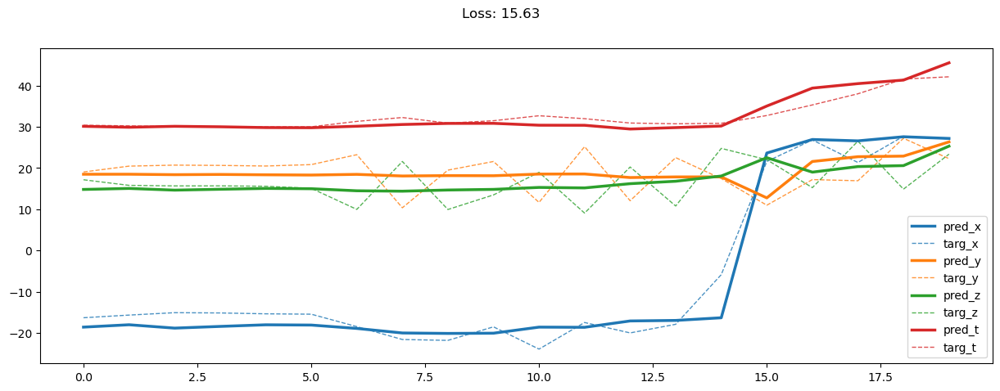

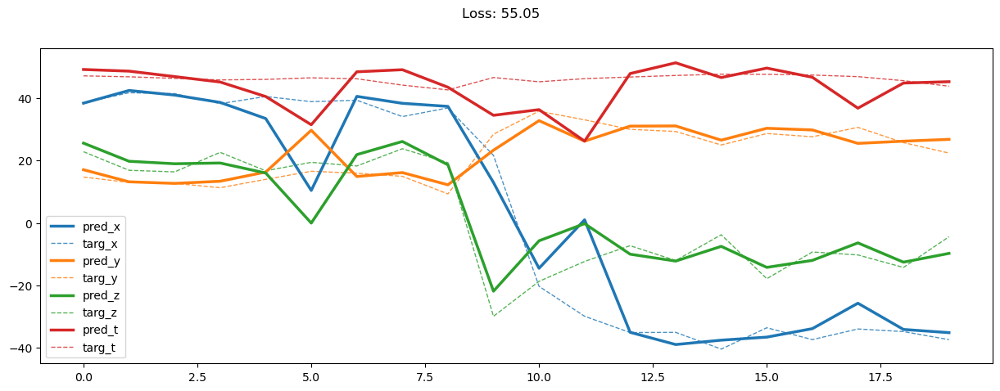

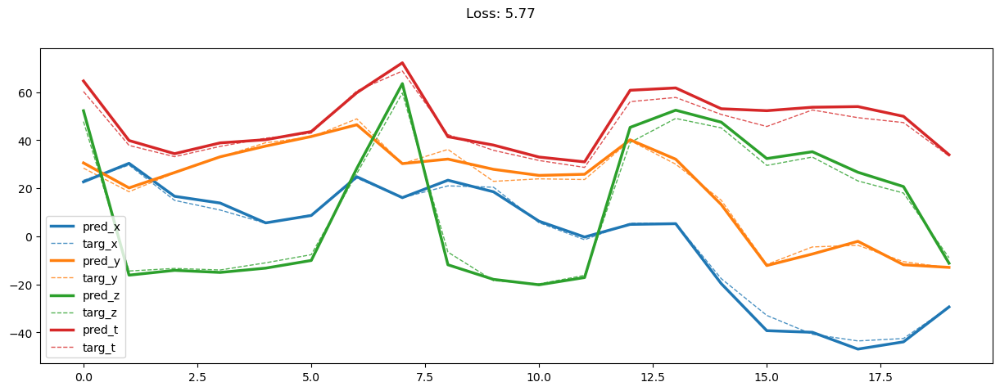

In [46]:
show_result(model, valid_loader)

In [47]:
model.cpu()
del model, optimizer, train_loader, valid_loader, train_dataset, valid_dataset
gc.collect()
torch.cuda.empty_cache()

In [48]:
gt = 'swing'

classes, train_dataset, valid_dataset = for_dataloaders(prep_valid_traj, gt)
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=64, shuffle=False)

model = NotSimpleTransformer(seq_len=seq_len, num_of_classes=num_of_classes).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.00005)

{1: 'front_pocket', 2: 'horizontal', 3: 'pocket', 0: 'swing', 4: 'target'}


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 19999/20000 [2:37:05<00:00,  2.24it/s]

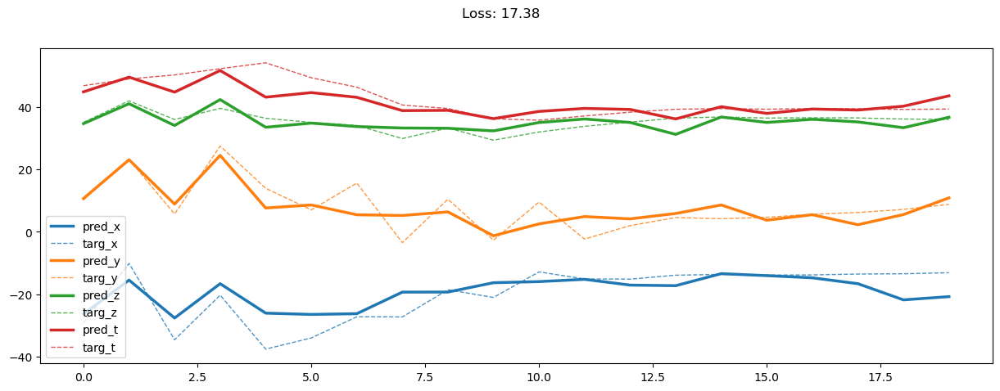

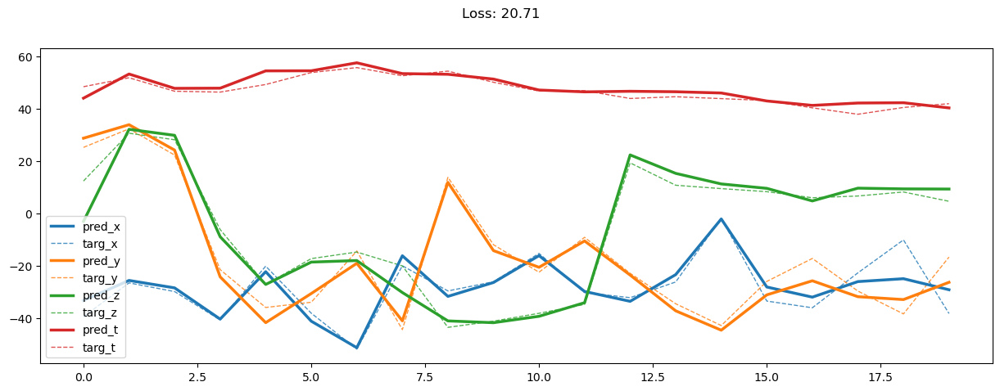

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20000/20000 [2:37:06<00:00,  2.12it/s]

19999: train loss: 158.731, imu loss:  4.932, mag loss: 50.099, div loss: 100.373, slim:  4.357, tlim:  2.984
       valid loss: 71.039, imu loss:  4.686, mag loss: 24.315, div loss: 39.565, slim:  4.065, tlim:  1.942


In [49]:
EPOCH = 20000
draw = False

for epoch in tqdm(range(EPOCH)):
    #####
    # 1. 用上半部訓練50epoch
    # 2. 隨機用上或下半部訓練Model
    # 3. 印出trajectory結果
    #####
    
    draw = ((epoch + 1) % 20000 == 0)
    
    train_loss, train_imu_loss, train_mag_loss, t_d1_loss, tlim_loss = train(train_loader, draw)
    
    if (epoch + 1) % 20000 == 0:
        valid_loss, valid_imu_loss, valid_mag_loss, v_d1_loss, vlim_loss = evalute(valid_loader, draw)
        print(f'{epoch:05d}: train loss: {train_loss:>6.3f}, imu loss: {train_imu_loss:>6.3f}, mag loss: {train_mag_loss:>6.3f}, div loss: {t_d1_loss:>6.3f}, slim: {tlim_loss[0]:>6.3f}, tlim: {tlim_loss[1]:>6.3f}\n' +
              f'{"":>5}  valid loss: {valid_loss:>6.3f}, imu loss: {valid_imu_loss:>6.3f}, mag loss: {valid_mag_loss:>6.3f}, div loss: {v_d1_loss:>6.3f}, slim: {vlim_loss[0]:>6.3f}, tlim: {vlim_loss[1]:>6.3f}')

(1348, 4) (1348, 3) (1348,)
           loss name|   diff x   diff y   diff z      avg
   front_pocket loss:    20.79    35.32    11.56    22.55
     horizontal loss:    17.93    42.47    25.22    28.54
         pocket loss:    12.27    20.97    11.64    14.96
         target loss:    24.08    39.42    17.17    26.89
        average loss:    18.77    34.55    16.39    23.24


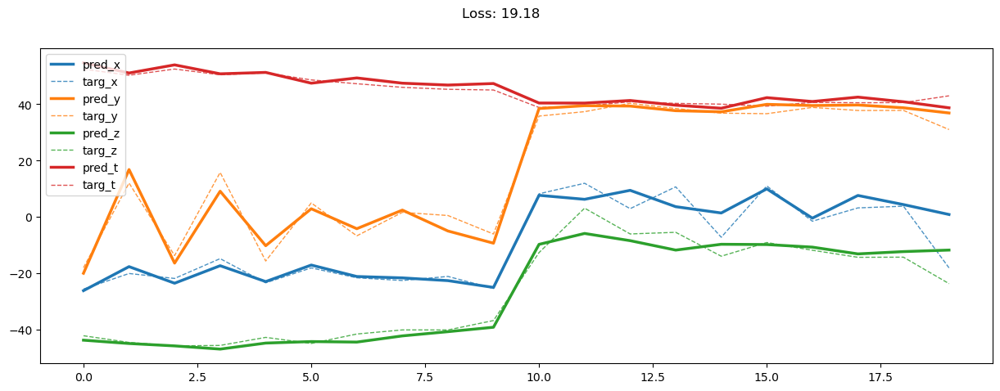

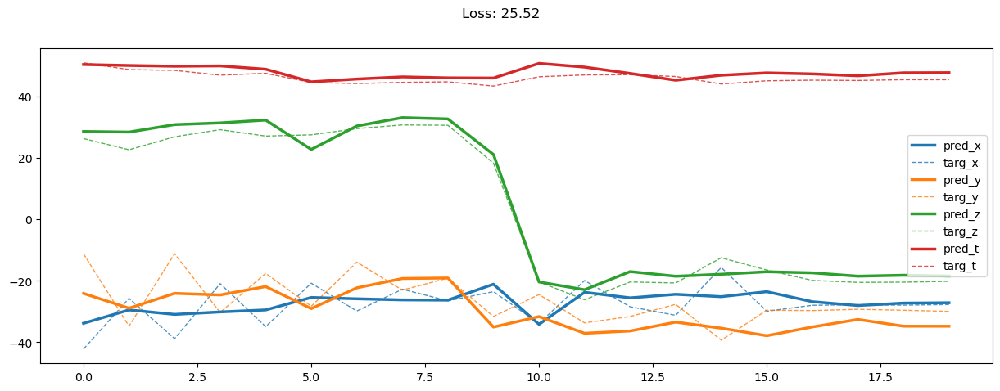

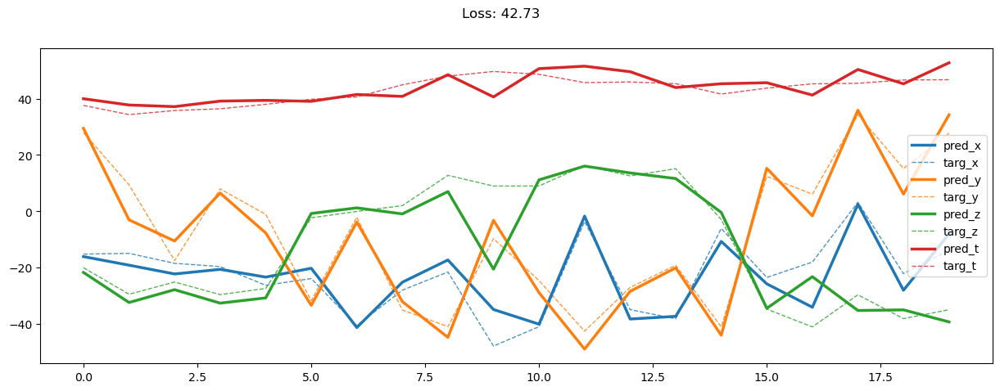

In [50]:
show_result(model, train_loader)

(1348, 4) (1348, 3) (1348,)
           loss name|   diff x   diff y   diff z      avg
   front_pocket loss:    21.74    36.84    12.16    23.58
     horizontal loss:    18.66    44.78    27.38    30.27
         pocket loss:    13.44    22.29    14.25    16.66
         target loss:    24.78    40.64    17.44    27.62
        average loss:    19.66    36.14    17.81    24.53


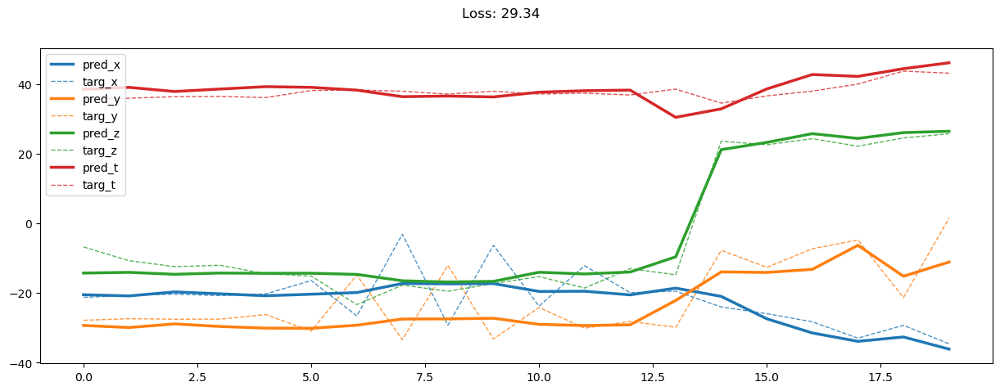

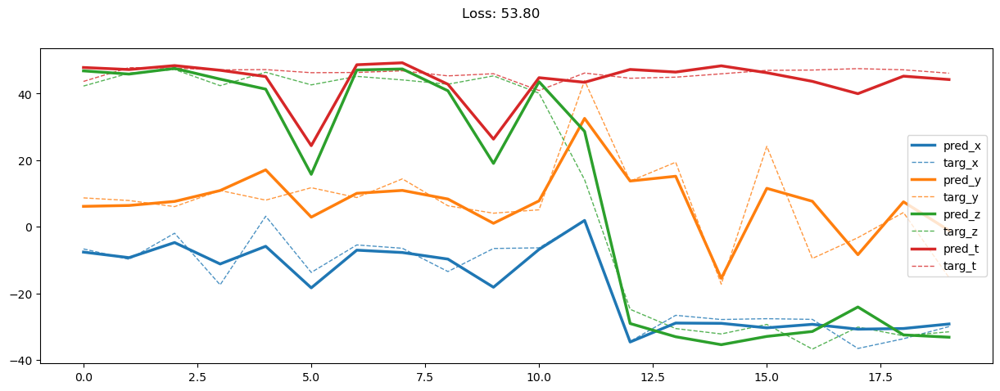

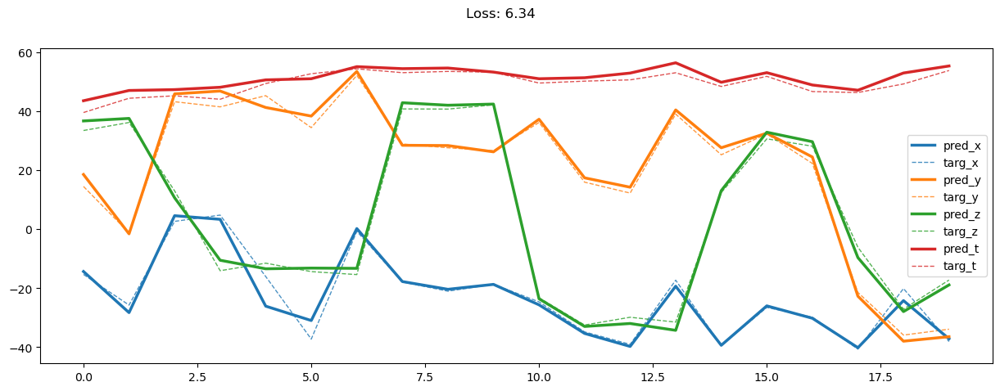

In [51]:
show_result(model, valid_loader)

In [52]:
model.cpu()
del model, optimizer, train_loader, valid_loader, train_dataset, valid_dataset
gc.collect()
torch.cuda.empty_cache()